### Patches

BRC_2022: 570 frames total
  train: 0
  val: 0
  test: 570


/tmp/ipykernel_3963725/2443054994.py:75: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(markerscale=4, loc="upper right")


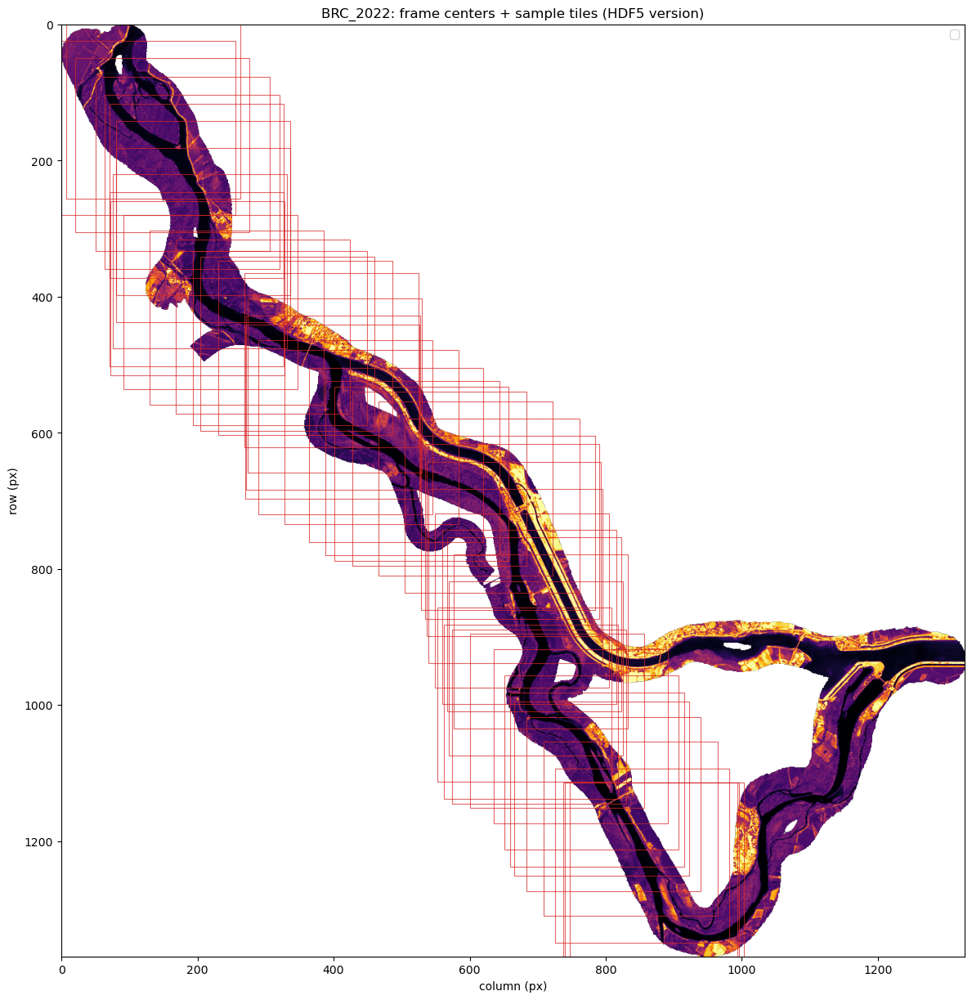

In [ ]:
"""
Overlay generated frames on the full campaign raster (HDF5 version)
"""
import json
from pathlib import Path
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

BASE = Path("/share/home/e2406751/Superresolution-TIR/data")
HR_DIR = BASE / "HR_downsampled"
PATCH_DIR = BASE / "processed/seq_patches2"   # <-- changed to new folder

HR_TILE = 256
CAMPAIGN = "BRC_2022"          # change this
N_SAMPLE_RECTANGLES = 50       # number of example tile boxes to draw

SPLIT_COLORS = {"train": "tab:blue", "val": "tab:green", "test": "tab:red"}

# ------------------------------------------------------------------
# Load background raster
# ------------------------------------------------------------------
hr_path = HR_DIR / f"{CAMPAIGN}.tif"
with rasterio.open(hr_path) as src:
    hr_data = src.read(1).astype(np.float32)
    hr_nodata = src.nodata
    if hr_nodata is not None:
        hr_data = np.where(hr_data < -1e30, np.nan, hr_data)

valid_vals = hr_data[np.isfinite(hr_data)]
vmin, vmax = np.percentile(valid_vals, [2, 98])

# ------------------------------------------------------------------
# Load metadata
# ------------------------------------------------------------------
with open(PATCH_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)

campaign_frames = {fid: m for fid, m in frame_metadata.items() if m["campaign"] == CAMPAIGN}
print(f"{CAMPAIGN}: {len(campaign_frames)} frames total")

for split in ["train", "val", "test"]:
    n = sum(1 for m in campaign_frames.values() if m.get("split") == split)
    print(f"  {split}: {n}")

# ------------------------------------------------------------------
# Plot
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 14))
ax.imshow(hr_data, cmap="inferno", vmin=vmin, vmax=vmax)

# Scatter centers
for split, color in SPLIT_COLORS.items():
    rows = [m["row_origin"] + HR_TILE//2 for m in campaign_frames.values() if m.get("split") == split]
    cols = [m["col_origin"] + HR_TILE//2 for m in campaign_frames.values() if m.get("split") == split]
    # if rows:
    #     ax.scatter(cols, rows, s=3, color=color, alpha=0.7, label=f"{split} (n={len(rows)})")

# Sample tile footprints
for split, color in SPLIT_COLORS.items():
    ids = [fid for fid, m in campaign_frames.items() if m.get("split") == split]
    if not ids:
        continue
    step = max(1, len(ids) // N_SAMPLE_RECTANGLES)
    for fid in ids[::step]:
        m = campaign_frames[fid]
        rect = mpatches.Rectangle(
            (m["col_origin"], m["row_origin"]), HR_TILE, HR_TILE,
            linewidth=0.8, edgecolor=color, facecolor="none", alpha=0.7
        )
        ax.add_patch(rect)

ax.set_title(f"{CAMPAIGN}: frame centers + sample tiles (HDF5 version)")
ax.legend(markerscale=4, loc="upper right")
ax.set_xlabel("column (px)")
ax.set_ylabel("row (px)")
plt.tight_layout()
plt.show()

PDR_2023: 2095 frames total, 419 sequences total
showing sequence: PDR_2023_b0_s0002346 (5 frames)
consecutive-frame IoU: mean=87.86%, min=87.03%, max=89.67%


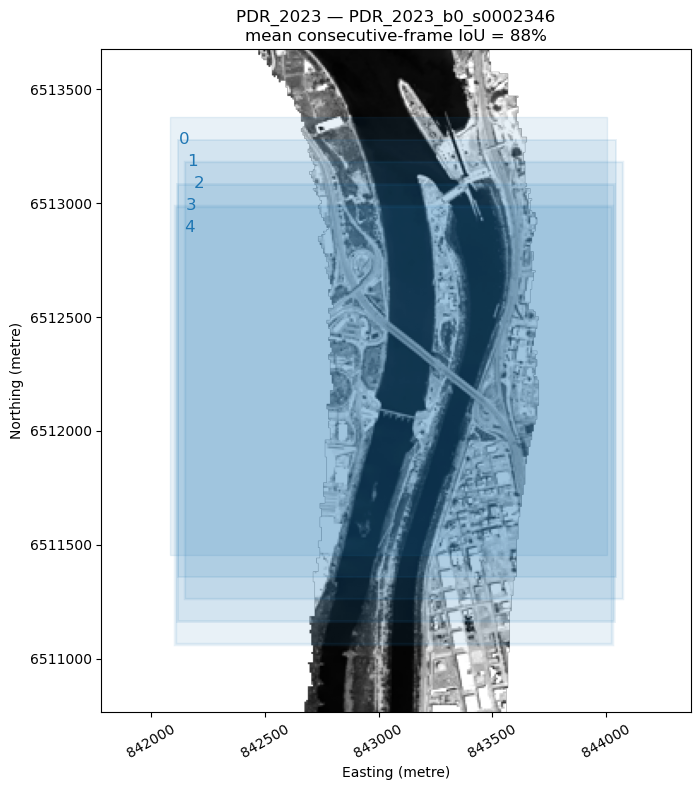

In [55]:
"""
Zoom into a few example sequences to show frame-to-frame overlap
(motivates why sequential/video SR needed its own re-patching along the centerline).
"""
import json
from pathlib import Path

import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.cm as cm

BASE = Path("/share/home/e2406751/Superresolution-TIR/data")
HR_DIR = BASE / "HR_downsampled"
OUT_DIR = BASE / "processed/seq_patches2"

HR_TILE = 256
CAMPAIGN = "PDR_2023"       # change this
SEQUENCE_NAME = None        # e.g. "BRC_2022_b0_s0000417" — set explicitly, or leave
                             # None to auto-pick a representative (median-length) sequence
PAD = 40                    # px padding around the sequence's bounding box, for context

# ------------------------------------------------------------------
# Load metadata — frame-level (dict keyed by fid) and sequence-level
# (list of dicts with 'sequence_name', 'campaign', 'block_id', 'frame_ids').
# Adjust the filename below if yours isn't called sequence_metadata.json.
# ------------------------------------------------------------------
with open(OUT_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)

with open(OUT_DIR / "sequence_manifest.json") as f:
    sequence_metadata = json.load(f)

campaign_frames = {fid: m for fid, m in frame_metadata.items() if m["campaign"] == CAMPAIGN}
campaign_seqs = [s for s in sequence_metadata if s["campaign"] == CAMPAIGN]
print(f"{CAMPAIGN}: {len(campaign_frames)} frames total, {len(campaign_seqs)} sequences total")

# seq_id -> ordered list of (fid, frame_meta), using frame_ids order as given
seqs = {}
for s in campaign_seqs:
    sid = s["sequence_name"]
    seqs[sid] = [(fid, frame_metadata[fid]) for fid in s["frame_ids"]]

# pick a single sequence to show: either the one you named, or an auto-picked
# one with a "typical" number of frames (median), so it's representative
# rather than a hand-picked cherry.
candidate_seqs = [sid for sid, frames in seqs.items() if len(frames) > 1]
if SEQUENCE_NAME is not None:
    chosen_sid = SEQUENCE_NAME
else:
    lengths = {sid: len(seqs[sid]) for sid in candidate_seqs}
    median_len = int(np.median(list(lengths.values())))
    chosen_sid = min(candidate_seqs, key=lambda sid: abs(lengths[sid] - median_len))
print("showing sequence:", chosen_sid, f"({len(seqs[chosen_sid])} frames)")

frames = seqs[chosen_sid]

# ------------------------------------------------------------------
# Quantify the overlap between consecutive frames (IoU of tile footprints)
# — gives you an actual number to cite in the write-up instead of "a lot"
# ------------------------------------------------------------------
def iou(m1, m2, tile=HR_TILE):
    r1, c1 = m1["row_origin"], m1["col_origin"]
    r2, c2 = m2["row_origin"], m2["col_origin"]
    inter_r = max(0, min(r1 + tile, r2 + tile) - max(r1, r2))
    inter_c = max(0, min(c1 + tile, c2 + tile) - max(c1, c2))
    inter_area = inter_r * inter_c
    union_area = 2 * tile * tile - inter_area
    return inter_area / union_area

ious = [iou(frames[i][1], frames[i + 1][1]) for i in range(len(frames) - 1)]
print(f"consecutive-frame IoU: mean={np.mean(ious):.2%}, "
      f"min={min(ious):.2%}, max={max(ious):.2%}")

# ------------------------------------------------------------------
# Load background raster once, keep the affine transform for pixel->map coords
# ------------------------------------------------------------------
hr_path = HR_DIR / f"{CAMPAIGN}.tif"
with rasterio.open(hr_path) as src:
    hr_data = src.read(1).astype(np.float32)
    hr_nodata = src.nodata
    if hr_nodata is not None:
        hr_data = np.where(hr_data < -1e30, np.nan, hr_data)
    transform = src.transform
    crs = src.crs

valid_vals = hr_data[np.isfinite(hr_data)]
vmin, vmax = np.percentile(valid_vals, [2, 98])

def px_to_map(row, col):
    """Pixel (row, col) -> map (x, y) at the pixel's upper-left corner."""
    x, y = transform * (col, row)
    return x, y

# ------------------------------------------------------------------
# Plot: single sequence, zoomed in tight, frames numbered 0..N-1
# ------------------------------------------------------------------
rows = [m["row_origin"] for _, m in frames]
cols = [m["col_origin"] for _, m in frames]

r0 = max(0, min(rows) - PAD)
r1 = min(hr_data.shape[0], max(rows) + HR_TILE + PAD)
c0 = max(0, min(cols) - PAD)
c1 = min(hr_data.shape[1], max(cols) + HR_TILE + PAD)

left, top = px_to_map(r0, c0)
right, bottom = px_to_map(r1, c1)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(hr_data[r0:r1, c0:c1], cmap="gray", vmin=vmin, vmax=vmax,
          extent=[left, right, bottom, top])

n = len(frames)
color = "tab:blue"
for i, (fid, m) in enumerate(frames):
    x0, y0 = px_to_map(m["row_origin"], m["col_origin"])                       # upper-left
    x1, y1 = px_to_map(m["row_origin"] + HR_TILE, m["col_origin"] + HR_TILE)   # lower-right
    lw = 1.0 + 1.5 * (i / max(n - 1, 1))   # later frames drawn slightly thicker
    rect = mpatches.Rectangle(
        (x0, y1), x1 - x0, y0 - y1,   # (lower-left corner), width, height — all positive
        linewidth=lw, edgecolor=color, facecolor=color, alpha=0.1,
    )
    ax.add_patch(rect)
    ax.text(x0 + 0.02 * (x1 - x0), y0 - 0.06 * (y0 - y1), str(i),
            color=color, fontsize=12)

ax.set_title(f"{CAMPAIGN} — {chosen_sid}\nmean consecutive-frame IoU = {np.mean(ious):.0%}")
ax.set_xlabel(f"Easting ({crs.linear_units if crs else 'm'})")
ax.set_ylabel(f"Northing ({crs.linear_units if crs else 'm'})")
ax.ticklabel_format(style="plain", axis="both")   # avoid scientific notation on large UTM/L93 coords
plt.xticks(rotation=30)
plt.tight_layout()
# plt.savefig(OUT_DIR / f"{CAMPAIGN}_{chosen_sid}_overlap.png", dpi=200, bbox_inches="tight")
plt.show()

Selected Random Sequence: DZM_2014_b1_s0001206
Campaign: DZM_2014 | Block: 1 | Frames: 5


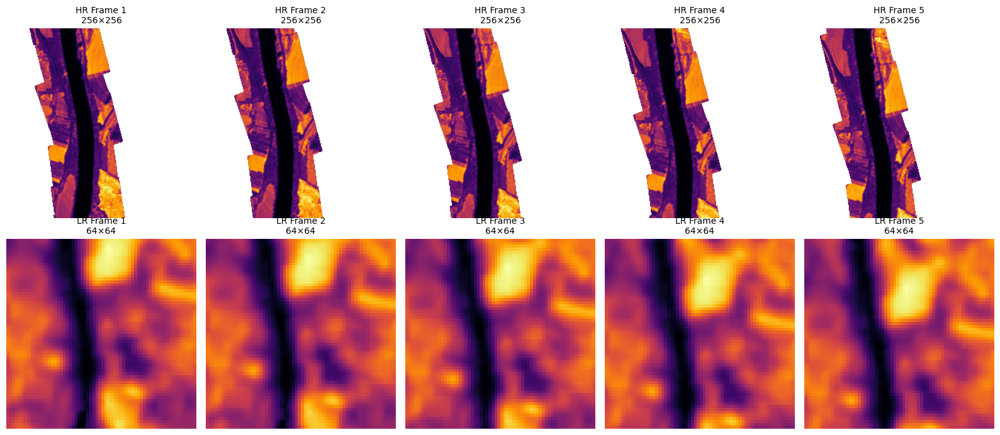

In [59]:
import h5py
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# ============================================================
# Configuration
# ============================================================
OUT_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches2")

# ============================================================
# Execution
# ============================================================
def main():
    manifest_path = OUT_DIR / "sequence_manifest.json"
    metadata_path = OUT_DIR / "frame_metadata.json"
    hr_h5_path = OUT_DIR / "hr_frames.h5"
    lr_h5_path = OUT_DIR / "lr_frames.h5"

    if not manifest_path.exists():
        print(f"Error: Could not find manifest at {manifest_path}")
        return

    # 1. Load sequence manifest and metadata
    with open(manifest_path) as f:
        manifest = json.load(f)

    with open(metadata_path) as f:
        metadata = json.load(f)

    if len(manifest) == 0:
        print("Error: The sequence manifest is empty.")
        return

    # 2. Pick a RANDOM sequence from the manifest
    random_seq = random.choice(manifest)
    seq_name = random_seq["sequence_name"]
    campaign = random_seq["campaign"]
    block_id = random_seq["block_id"]
    frame_ids = random_seq["frame_ids"]

    print(f"Selected Random Sequence: {seq_name}")
    print(f"Campaign: {campaign} | Block: {block_id} | Frames: {len(frame_ids)}")

    # 3. Extract and plot frames directly from HDF5
    with h5py.File(hr_h5_path, "r") as hf_hr, h5py.File(lr_h5_path, "r") as hf_lr:
        fig, axes = plt.subplots(2, 5, figsize=(16, 7))
        
        for idx, f_id in enumerate(frame_ids):
            f_meta = metadata[f_id]
            f_idx = f_meta["frame_idx"]
            
            hr_img = hf_hr["frames"][f_idx]
            lr_img = hf_lr["frames"][f_idx]
            vmin, vmax = np.percentile(hr_img, [2, 98])  # For consistent color scaling

            # Top Row: High Resolution (256x256)
            axes[0, idx].imshow(hr_img, cmap="inferno")
            axes[0, idx].set_title(f"HR Frame {idx+1}\n256×256", fontsize=10)
            axes[0, idx].axis("off")
            
            # Bottom Row: Low Resolution (64x64)
            axes[1, idx].imshow(lr_img, cmap="inferno", interpolation="nearest")
            axes[1, idx].set_title(f"LR Frame {idx+1}\n64×64", fontsize=10)
            axes[1, idx].axis("off")

        # plt.suptitle(f"Sequence Inspection: {seq_name} ({campaign}, Block {block_id})", fontsize=14, y=0.98)
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()

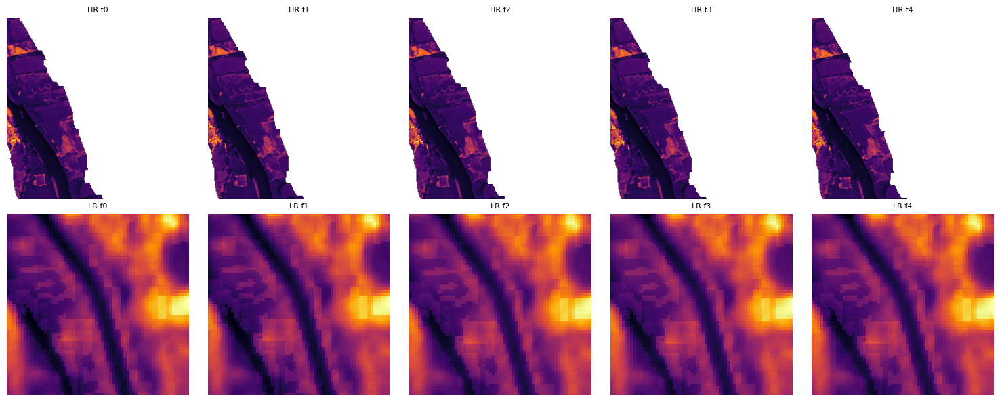

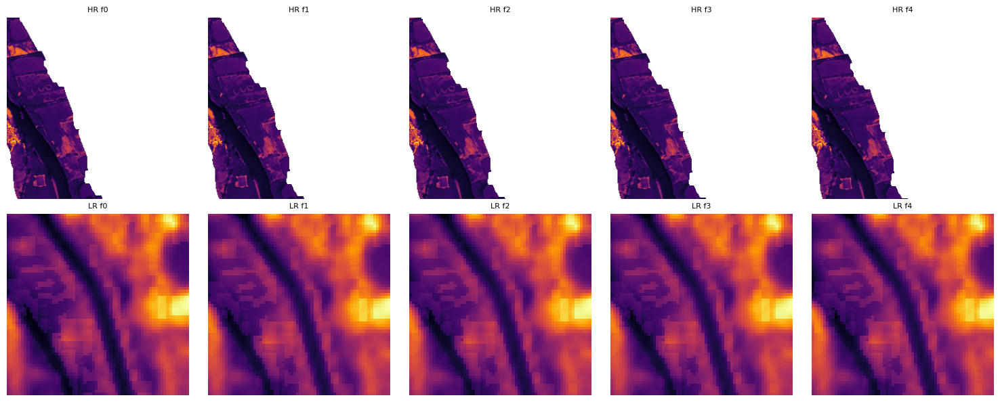

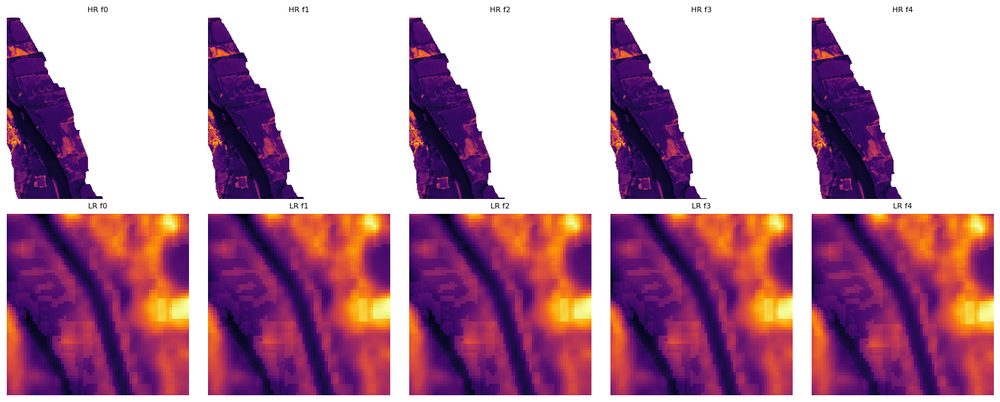

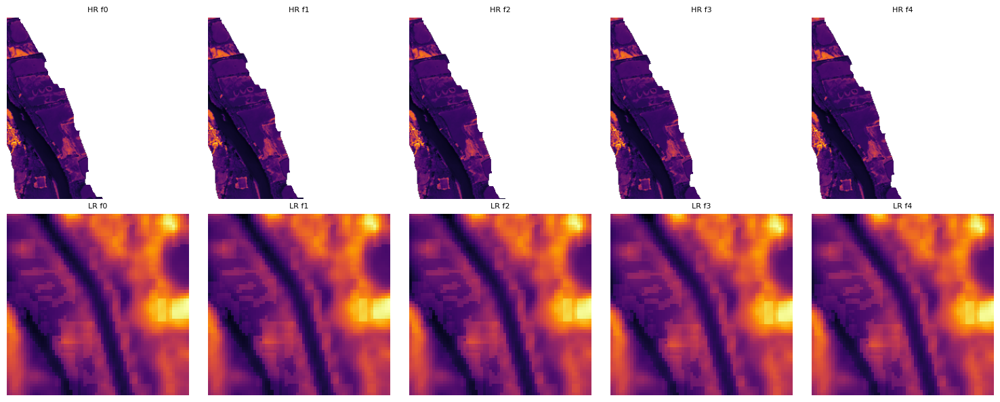

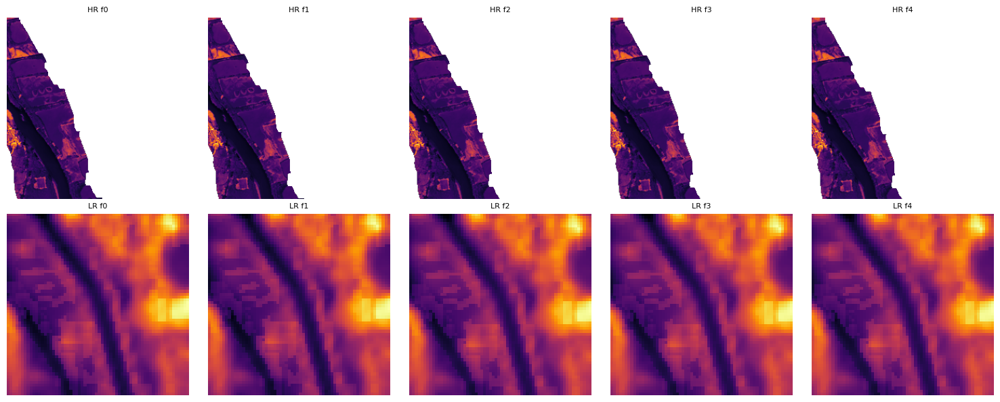

In [61]:
import json
from pathlib import Path
import matplotlib.pyplot as plt
import h5py

# Point to your HDF5 directory
OUT_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches")
N_CONSECUTIVE_SEQUENCES = 5     
SPLIT_TO_INSPECT = "train"  
START_SEQ_INDEX = 100  # Index where your river bend starts

# 1. Load Manifest & Metadata
with open(OUT_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)
with open(OUT_DIR / "sequence_manifest.json") as f:
    sequence_manifest = json.load(f)

# 2. Filter sequences for inspection
candidates = [s for s in sequence_manifest if s["split"] == SPLIT_TO_INSPECT]

if not candidates:
    print(f"No candidates found for split: {SPLIT_TO_INSPECT}")
else:
    # Slice CONSECUTIVE sequences starting from START_SEQ_INDEX
    sample = candidates[START_SEQ_INDEX : START_SEQ_INDEX + N_CONSECUTIVE_SEQUENCES]

    # Open HDF5 files ONCE
    with h5py.File(OUT_DIR / "hr_frames.h5", "r") as hf_hr, h5py.File(OUT_DIR / "lr_frames.h5", "r") as hf_lr:
        
        for seq in sample:
            seq_name = seq["sequence_name"]
            frame_ids = seq["frame_ids"]

            # Exact same subplot structure as your original script
            fig, axes = plt.subplots(2, len(frame_ids), figsize=(3 * len(frame_ids), 6))
            
            for i, fid in enumerate(frame_ids):
                meta = frame_metadata[fid]
                f_idx = meta["frame_idx"] # Direct position in HDF5 array

                # Read exact array slice from HDF5
                hr = hf_hr["frames"][f_idx]
                lr = hf_lr["frames"][f_idx]

                # EXACT SAME imshow syntax from your old working script
                axes[0, i].imshow(hr, cmap="inferno")
                axes[0, i].set_title(f"HR f{i}", fontsize=8)
                axes[0, i].axis("off")

                axes[1, i].imshow(lr, cmap="inferno")
                axes[1, i].set_title(f"LR f{i}", fontsize=8)
                axes[1, i].axis("off")


            fig.tight_layout()
            plt.show()

Selected Random Sequence: DZM_2023_b4_s0001547
Campaign: DZM_2023 | Block: 4 | Frames: 5


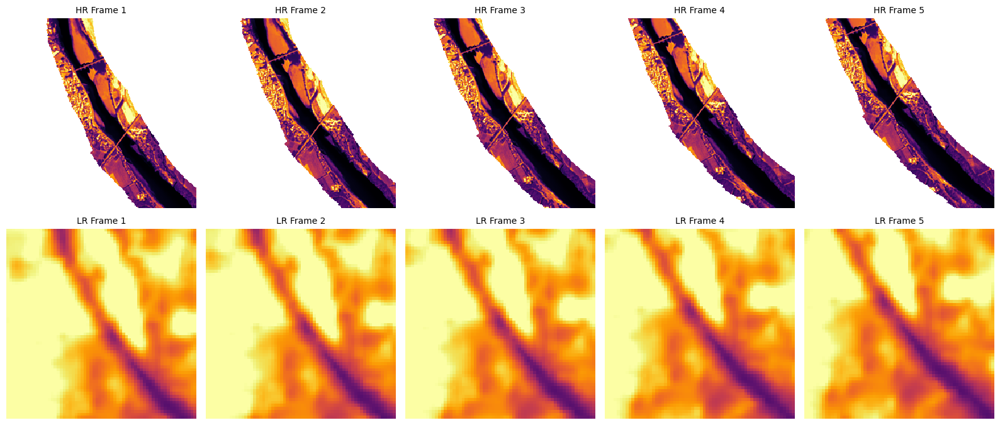

In [88]:
import h5py
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# ============================================================
# Configuration
# ============================================================
OUT_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches2")

# ============================================================
# Execution
# ============================================================
def main():
    manifest_path = OUT_DIR / "sequence_manifest.json"
    metadata_path = OUT_DIR / "frame_metadata.json"
    hr_h5_path = OUT_DIR / "hr_frames.h5"
    lr_h5_path = OUT_DIR / "lr_frames.h5"

    if not manifest_path.exists():
        print(f"Error: Could not find manifest at {manifest_path}")
        return

    # 1. Load sequence manifest and metadata
    with open(manifest_path) as f:
        manifest = json.load(f)

    with open(metadata_path) as f:
        metadata = json.load(f)

    if len(manifest) == 0:
        print("Error: The sequence manifest is empty.")
        return

    # 2. Pick a RANDOM sequence from the manifest
    random_seq = random.choice(manifest)
    seq_name = random_seq["sequence_name"]
    campaign = random_seq["campaign"]
    block_id = random_seq["block_id"]
    frame_ids = random_seq["frame_ids"]

    print(f"Selected Random Sequence: {seq_name}")
    print(f"Campaign: {campaign} | Block: {block_id} | Frames: {len(frame_ids)}")

    # 3. Extract and plot frames directly from HDF5
    with h5py.File(hr_h5_path, "r") as hf_hr, h5py.File(lr_h5_path, "r") as hf_lr:
        fig, axes = plt.subplots(2, 5, figsize=(16, 7))
        
        # Gather all HR frames in this sequence to establish a unified color scale
        seq_hr_imgs = []
        for f_id in frame_ids:
            f_idx = metadata[f_id]["frame_idx"]
            seq_hr_imgs.append(hf_hr["frames"][f_idx])
            
        # Global 2nd and 98th percentiles across the whole 5-frame sequence
        valid_pixels = np.concatenate([img[np.isfinite(img)] for img in seq_hr_imgs])
        global_vmin, global_vmax = np.percentile(valid_pixels, [2, 98])
        
        for idx, f_id in enumerate(frame_ids):
            f_meta = metadata[f_id]
            f_idx = f_meta["frame_idx"]
            
            hr_img = hf_hr["frames"][f_idx]
            lr_img = hf_lr["frames"][f_idx]

            # Top Row: High Resolution (256x256)
            axes[0, idx].imshow(
                hr_img, 
                cmap="inferno", 
                vmin=global_vmin, 
                vmax=global_vmax,
                interpolation="nearest"
            )
            axes[0, idx].set_title(f"HR Frame {idx+1}", fontsize=10)
            axes[0, idx].axis("off")
            
            # Bottom Row: Low Resolution (64x64)
            # interpolation='nearest' preserves the blocky 30m pixel grid structure
            axes[1, idx].imshow(
                lr_img, 
                cmap="inferno", 
                vmin=global_vmin, 
                vmax=global_vmax, 
                interpolation="nearest"
            )
            axes[1, idx].set_title(f"LR Frame {idx+1}", fontsize=10)
            axes[1, idx].axis("off")

        # plt.suptitle(f"Sequence Inspection: {seq_name} ({campaign}, Block {block_id})", fontsize=14, y=0.98)
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()

### TIME GAP UPDATE ON METADATA   
DO NOT DELETE

In [26]:
import json
from pathlib import Path
from datetime import datetime, timedelta

# 1. Define the path here
BASE_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches2")
METADATA_PATH = BASE_DIR / "metadata.json"

# CAMPAIGN_DATA as you provided
CAMPAIGN_DATA = {
    "PDR_2023": {"air_time": "11:24-12:43", "sat_time": "10:22-10:23"},
    "DZM_2023": {"air_time": "11:35-12:19", "sat_time": "10:29-10:30"},
    "BRC_2023": {"air_time": "11:48-12:57", "sat_time": "10:22-10:23"},
    "BRC_2022": {"air_time": "12:07-13:14", "sat_time": "10:23-10:24"},
    "DZM_2019": {"air_time": "15:40-16:30", "sat_time": "10:23-10:24"},
    "PDR_2013": {"air_time": "17:47-18:18", "sat_time": "10:25-10:26"},
    "PDR_2014": {"air_time": "16:06-16:31", "sat_time": "10:23-10:24"},
    "DZM_2013": {"air_time": "14:40-15:15", "sat_time": "10:25-10:26"},
    "DZM_2014": {"air_time": "15:40-16:00", "sat_time": "10:29-10:30"},
    "BAS_2025": {"air_time": "15:02-16:37", "sat_time": "10:29-10:30"},
    "HAUT_2025": {"air_time": "14:43-16:21", "sat_time": "10:22-10:23"}
}

def get_avg_time_decimal(time_str):
    """Parses 'HH:MM-HH:MM' and returns decimal hours."""
    start, end = [datetime.strptime(t, "%H:%M") for t in time_str.split('-')]
    if end < start: end += timedelta(days=1)
    avg = start + (end - start) / 2
    return round(avg.hour + avg.minute / 60.0, 2)

def get_time_gap(air_time_str, sat_time_str):
    """Calculates gap in hours between two HH:MM-HH:MM ranges."""
    def to_dt(ts):
        start, end = [datetime.strptime(t, "%H:%M") for t in ts.split('-')]
        if end < start: end += timedelta(days=1)
        return start + (end - start) / 2
    
    delta = abs((to_dt(air_time_str) - to_dt(sat_time_str)).total_seconds()) / 3600.0
    return round(delta, 2)

def update_metadata(metadata_path):
    # 1. Load the data
    with open(metadata_path, 'r') as f:
        meta = json.load(f)
    
    # 2. Iterate and update
    updated_count = 0
    for key, info in meta.items():
        camp = info.get("campaign") # Use .get() to avoid KeyError if field missing
        
        if camp in CAMPAIGN_DATA:
            cfg = CAMPAIGN_DATA[camp]
            
            # Date conversion
            d1 = datetime.strptime(info["hr_date"], "%Y-%m-%d")
            d2 = datetime.strptime(info["lr_date"], "%Y-%m-%d")
            info["date_gap_days"] = abs((d1 - d2).days)
            
            # Time calculations
            info["time_gap_hours"] = get_time_gap(cfg["air_time"], cfg["sat_time"])
            info["hr_time"] = get_avg_time_decimal(cfg["air_time"])
            info["lr_time"] = get_avg_time_decimal(cfg["sat_time"])
            
            updated_count += 1
        # else:
        #     print(f"DEBUG: Campaign '{camp}' found in key {key} but not in CAMPAIGN_DATA.")
            
    # 3. Save the result
    with open(metadata_path, 'w') as f:
        json.dump(meta, f, indent=4)
        
    print(f"Success! Updated {updated_count} frames.")

update_metadata(METADATA_PATH)

Success! Updated 975 frames.


In [ ]:
import json
from pathlib import Path
from datetime import datetime, timedelta

# Update this path to match your new sequence directory
BASE_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches2")
METADATA_PATH = BASE_DIR / "frame_metadata.json"

CAMPAIGN_DATA = {
    "PDR_2023": {"air_time": "11:24-12:43", "sat_time": "10:22-10:23"},
    "DZM_2023": {"air_time": "11:35-12:19", "sat_time": "10:29-10:30"},
    "BRC_2023": {"air_time": "11:48-12:57", "sat_time": "10:22-10:23"},
    "BRC_2022": {"air_time": "12:07-13:14", "sat_time": "10:23-10:24"},
    "DZM_2019": {"air_time": "15:40-16:30", "sat_time": "10:23-10:24"},
    "PDR_2013": {"air_time": "17:47-18:18", "sat_time": "10:25-10:26"},
    "PDR_2014": {"air_time": "16:06-16:31", "sat_time": "10:23-10:24"},
    "DZM_2013": {"air_time": "14:40-15:15", "sat_time": "10:25-10:26"},
    "DZM_2014": {"air_time": "15:40-16:00", "sat_time": "10:29-10:30"},
    "BAS_2025": {"air_time": "15:02-16:37", "sat_time": "10:29-10:30"},
    "HAUT_2025": {"air_time": "14:43-16:21", "sat_time": "10:22-10:23"}
}

def get_avg_time_decimal(time_str):
    """Parses 'HH:MM-HH:MM' and returns decimal hours."""
    start, end = [datetime.strptime(t, "%H:%M") for t in time_str.split('-')]
    if end < start: 
        end += timedelta(days=1)
    avg = start + (end - start) / 2
    return round(avg.hour + avg.minute / 60.0, 2)

def get_time_gap(air_time_str, sat_time_str):
    """Calculates gap in hours between two HH:MM-HH:MM ranges."""
    def to_dt(ts):
        start, end = [datetime.strptime(t, "%H:%M") for t in ts.split('-')]
        if end < start: 
            end += timedelta(days=1)
        return start + (end - start) / 2
    
    delta = abs((to_dt(air_time_str) - to_dt(sat_time_str)).total_seconds()) / 3600.0
    return round(delta, 2)

def update_frame_metadata(metadata_path):
    if not metadata_path.exists():
        print(f"Error: Could not find metadata file at {metadata_path}")
        return

    with open(metadata_path, 'r') as f:
        meta = json.load(f)
    
    updated_count = 0
    for frame_id, info in meta.items():
        camp = info.get("campaign")
        
        if camp in CAMPAIGN_DATA:
            cfg = CAMPAIGN_DATA[camp]
            
            # Recalculate date gaps (just to keep things consistent)
            d1 = datetime.strptime(info["hr_date"], "%Y-%m-%d")
            d2 = datetime.strptime(info["lr_date"], "%Y-%m-%d")
            info["date_gap_days"] = abs((d1 - d2).days)
            
            # Inject calculated temporal gaps/times
            info["time_gap_hours"] = get_time_gap(cfg["air_time"], cfg["sat_time"])
            info["hr_time"] = get_avg_time_decimal(cfg["air_time"])
            info["lr_time"] = get_avg_time_decimal(cfg["sat_time"])
            
            updated_count += 1
            
    with open(metadata_path, 'w') as f:
        json.dump(meta, f, indent=4)
        
    print(f"Success! Updated temporal features for {updated_count} frames in {metadata_path.name}.")

if __name__ == "__main__":
    update_frame_metadata(METADATA_PATH)

In [1]:
import json
from pathlib import Path
from datetime import datetime, timedelta

# ====================== PATHS ======================
BASE_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches")
METADATA_PATH = BASE_DIR / "frame_metadata.json"
PAIRING_JSON_PATH = "/share/home/e2406751/Superresolution-TIR/data/hr_lr_pairs.json"  

# Campaign time windows
CAMPAIGN_DATA = {
    "PDR_2023": {"air_time": "11:24-12:43", "sat_time": "10:22-10:23"},
    "DZM_2023": {"air_time": "11:35-12:19", "sat_time": "10:29-10:30"},
    "BRC_2023": {"air_time": "11:48-12:57", "sat_time": "10:22-10:23"},
    "BRC_2022": {"air_time": "12:07-13:14", "sat_time": "10:23-10:24"},
    "DZM_2019": {"air_time": "15:40-16:30", "sat_time": "10:23-10:24"},
    "PDR_2013": {"air_time": "17:47-18:18", "sat_time": "10:25-10:26"},
    "PDR_2014": {"air_time": "16:06-16:31", "sat_time": "10:23-10:24"},
    "DZM_2013": {"air_time": "14:40-15:15", "sat_time": "10:25-10:26"},
    "DZM_2014": {"air_time": "15:40-16:00", "sat_time": "10:29-10:30"},
    "BAS_2025": {"air_time": "15:02-16:37", "sat_time": "10:29-10:30"},
    "HAUT_2025": {"air_time": "14:43-16:21", "sat_time": "10:22-10:23"}
}

# ====================== HELPERS ======================
def get_avg_time_decimal(time_str: str) -> float:
    start_str, end_str = time_str.split('-')
    start = datetime.strptime(start_str, "%H:%M")
    end = datetime.strptime(end_str, "%H:%M")
    if end < start:
        end += timedelta(days=1)
    avg = start + (end - start) / 2
    return round(avg.hour + avg.minute / 60.0, 2)

def get_time_gap(air_time_str: str, sat_time_str: str) -> float:
    def to_dt(ts):
        s, e = ts.split('-')
        start = datetime.strptime(s, "%H:%M")
        end = datetime.strptime(e, "%H:%M")
        if end < start:
            end += timedelta(days=1)
        return start + (end - start) / 2
    delta = abs((to_dt(air_time_str) - to_dt(sat_time_str)).total_seconds()) / 3600.0
    return round(delta, 2)

# ====================== MAIN ======================
def update_metadata():
    if not METADATA_PATH.exists():
        print(f"Error: {METADATA_PATH} not found")
        return

    # Load pairing data
    with open(PAIRING_JSON_PATH) as f:
        pairing = json.load(f)

    # Create campaign -> date mapping
    campaign_dates = {}
    for pair in pairing["pairs"]:
        hr_name = pair["hr_name"].replace(".tif", "")
        selected = next((c for c in pair["candidates"] if c.get("selected", False)), None)
        if selected:
            campaign_dates[hr_name] = {
                "hr_date": pair["hr_date"],
                "lr_date": selected["ls_date"]
            }

    # Load frame metadata
    with open(METADATA_PATH, 'r') as f:
        meta = json.load(f)

    updated = 0
    for frame_id, info in meta.items():
        camp = info.get("campaign")
        if camp in campaign_dates and camp in CAMPAIGN_DATA:
            dates = campaign_dates[camp]
            cfg = CAMPAIGN_DATA[camp]

            # Add dates
            info["hr_date"] = dates["hr_date"]
            info["lr_date"] = dates["lr_date"]
            info["date_gap_days"] = abs((datetime.strptime(dates["hr_date"], "%Y-%m-%d") - 
                                       datetime.strptime(dates["lr_date"], "%Y-%m-%d")).days)

            # Add time features
            info["time_gap_hours"] = get_time_gap(cfg["air_time"], cfg["sat_time"])
            info["hr_time"] = get_avg_time_decimal(cfg["air_time"])
            info["lr_time"] = get_avg_time_decimal(cfg["sat_time"])

            updated += 1

    # Save
    with open(METADATA_PATH, 'w') as f:
        json.dump(meta, f, indent=4)

    print(f"Successfully updated {updated} frames with date & time information.")

if __name__ == "__main__":
    update_metadata()

Successfully updated 171600 frames with date & time information.


### Inference

In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F
from pathlib import Path
import json
import os
import sys

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
BASE = Path("/share/home/e2406751/Superresolution-TIR")
sys.path.insert(0, str(BASE))

PATCHES_DIR = BASE / "data/processed/seq_patches2"
STATS_PATH  = BASE / "data/processed/patches/stats.json"

with open(STATS_PATH) as f:
    stats_data = json.load(f)

HR_MEAN    = stats_data["hr"]["mean"]
HR_STD     = stats_data["hr"]["std"]
LR_MEAN    = stats_data["lr"]["mean"]
LR_STD     = stats_data["lr"]["std"]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device initialized: {device}")

Device initialized: cuda


In [2]:
# Load your custom dataset and model
from scripts.utils.seq_dataset import SRSequenceDataset
from scripts.models.basicvsrplus import BasicVSRModule

CHECKPOINT = (BASE / "checkpoints/vsr/spade1_epoch=epoch=28_val_water_mae=val/water_mae=0.9932.ckpt")
model = BasicVSRModule.load_from_checkpoint(CHECKPOINT, map_location=device, strict=False).to(device).eval()

# checkpoints/vsr/exp5_epoch=epoch=06_val_water_mae=val/water_mae=1.4410.ckpt  #baseline
# checkpoints/vsr/exp4_epoch=epoch=29_val_water_mae=val/water_mae=1.1471.ckpt  #aux
# checkpoints/vsr/spade1_epoch=epoch=28_val_water_mae=val/water_mae=0.9932.ckpt  # spade

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/lightning/fabric/utilities/cloud_io.py:73: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/share/home/e2406751/Superresoluti

[INFO] SpyNet: loaded after remapping mmediting key layout.
[WARNING] SpyNet: 2 missing keys
[INFO] BasicVSR++: loaded after stripping 'generator.' prefix.
[INFO] BasicVSR++: loaded after remapping mmediting key layout.
[WARNING] BasicVSR++: 32 missing keys
[INFO] Feature extractor input channels: 3 -> 26


/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/lightning/pytorch/core/saving.py:197: Found keys that are not in the model state dict but in the checkpoint: ['lpips_fn.net.net.slice1.0.weight', 'lpips_fn.net.net.slice1.0.bias', 'lpips_fn.net.net.slice1.2.weight', 'lpips_fn.net.net.slice1.2.bias', 'lpips_fn.net.net.slice2.5.weight', 'lpips_fn.net.net.slice2.5.bias', 'lpips_fn.net.net.slice2.7.weight', 'lpips_fn.net.net.slice2.7.bias', 'lpips_fn.net.net.slice3.10.weight', 'lpips_fn.net.net.slice3.10.bias', 'lpips_fn.net.net.slice3.12.weight', 'lpips_fn.net.net.slice3.12.bias', 'lpips_fn.net.net.slice3.14.weight', 'lpips_fn.net.net.slice3.14.bias', 'lpips_fn.net.net.slice4.17.weight', 'lpips_fn.net.net.slice4.17.bias', 'lpips_fn.net.net.slice4.19.weight', 'lpips_fn.net.net.slice4.19.bias', 'lpips_fn.net.net.slice4.21.weight', 'lpips_fn.net.net.slice4.21.bias', 'lpips_fn.net.net.slice5.24.weight', 'lpips_fn.net.net.slice5.24.bias', 'lpips_fn.net.net.slice5.26.weight', 'l

In [3]:
val_ds = SRSequenceDataset(split="val", patches_dir=PATCHES_DIR, stats_path=STATS_PATH)
print(f"Total sequences available: {len(val_ds)}")

[val] Loaded HDF5 files | Sequences: 586
Total sequences available: 586


In [3]:
test_ds = SRSequenceDataset(split="test", patches_dir=PATCHES_DIR, stats_path=STATS_PATH)
print(f"Total sequences available: {len(test_ds)}")

[test] Loaded HDF5 files | Sequences: 723
Total sequences available: 723


#### Baseline

In [27]:
def run_inference_all_frames(model, sample):
    lr_seq = sample["lr"]
    # lr_seq_3ch = lr_seq.repeat(1, 3, 1, 1)
    lr_input = lr_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype)
    with torch.no_grad():
        sr_seq = model.model(lr_input)  # [1, 5, 1, 256, 256]
    sr_all = sr_seq[0, :, 0, :, :].detach().cpu().float().numpy()  # [5, 256, 256]
    return sr_all * HR_STD + HR_MEAN

In [ ]:
# test metrics
from lightning.pytorch import Trainer
from torch.utils.data import DataLoader
# from scripts.utils.seq_dataset import SRSequenceDataset

# PATCHES_DIR = BASE / "data/processed/seq_patches2"
# STATS_PATH = BASE / "data/processed/patches/stats.json"

test_ds = SRSequenceDataset("test", PATCHES_DIR, STATS_PATH)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=6, pin_memory=True)

trainer = Trainer(accelerator="gpu", devices=1, precision="bf16-mixed", logger=False)
results = trainer.test(model, test_loader)
print(results)

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /share/home/e2406751/.conda/envs/sisr/lib/python3.11 ...
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


[test] Loaded HDF5 files | Sequences: 723


Output()

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torchmetrics/functional/image/lpips.py:332: 
FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the 
default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary 
code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more 
details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 
functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via 
this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We 
recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded 
file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location="cpu"), strict=False)

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/land_lpips      │     0.629192590713501     │
│       test/land_mae       │     4.711895942687988     │
│      test/land_psnr       │    13.808589935302734     │
│      test/land_rmse       │     5.871110439300537     │
│      test/land_ssim       │    0.43795105814933777    │
│     test/water_lpips      │    0.6234385967254639     │
│      test/water_mae       │     2.907517194747925     │
│      test/water_psnr      │    17.287153244018555     │
│      test/water_rmse      │    4.1388654708862305     │
│      test/water_ssim      │    0.43624067306518555    │
└───────────────────────────┴───────────────────────────┘

[{'test/land_psnr': 13.808589935302734, 'test/land_ssim': 0.43795105814933777, 'test/land_mae': 4.711895942687988, 'test/land_rmse': 5.871110439300537, 'test/land_lpips': 0.629192590713501, 'test/water_psnr': 17.287153244018555, 'test/water_ssim': 0.43624067306518555, 'test/water_mae': 2.907517194747925, 'test/water_rmse': 4.1388654708862305, 'test/water_lpips': 0.6234385967254639}]


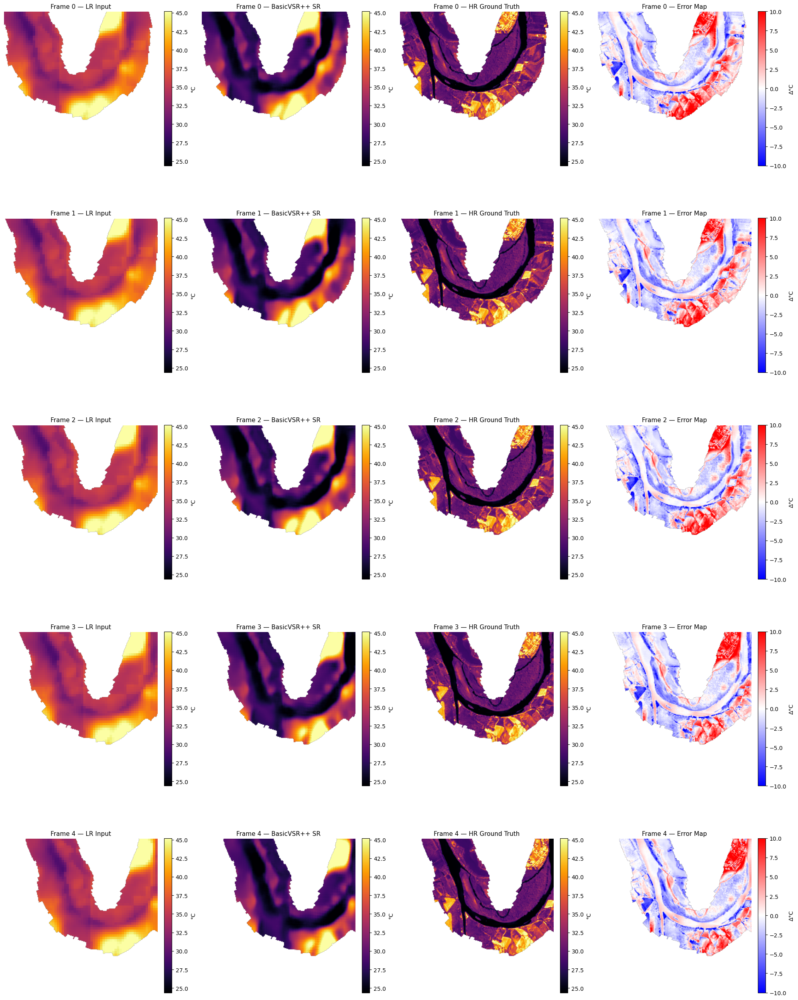

In [ ]:
sample_idx = 700
sample = test_ds[sample_idx]

lr_seq_full = sample['lr']  # [5, 1, 64, 64]
sr_all = run_inference_all_frames(model, sample)  # [5, 256, 256]

# --- 1. Pre-process frames & compute global colorbar bounds ---
lr_masked_list = []
sr_masked_list = []
hr_masked_list = []
error_map_list = []

for f in range(5):
    hr_target = sample['hr'][f]
    mask_hr_np = sample['hr_mask'][f, 0, :, :].cpu().numpy()
    valid = mask_hr_np > 0.5

    sr_denorm = sr_all[f]
    hr_denorm = (hr_target[0, :, :].cpu().numpy() * HR_STD) + HR_MEAN

    lr_raw = lr_seq_full[f, 0, :, :].cpu().numpy()
    lr_denorm = lr_raw * LR_STD + LR_MEAN
    lr_256_denorm = np.repeat(np.repeat(lr_denorm, 4, axis=0), 4, axis=1)

    lr_m = np.where(valid, lr_256_denorm, np.nan)
    sr_m = np.where(valid, sr_denorm, np.nan)
    hr_m = np.where(valid, hr_denorm, np.nan)
    err_m = sr_m - hr_m

    lr_masked_list.append(lr_m)
    sr_masked_list.append(sr_m)
    hr_masked_list.append(hr_m)
    error_map_list.append(err_m)

# Compute global limits across the entire sequence
all_valid_hr = np.concatenate([h[np.isfinite(h)] for h in hr_masked_list])
all_valid_errors = np.concatenate([np.abs(e[np.isfinite(e)]) for e in error_map_list])

global_vmin = np.percentile(all_valid_hr, 1) if len(all_valid_hr) > 0 else 15.0
global_vmax = np.percentile(all_valid_hr, 99) if len(all_valid_hr) > 0 else 30.0

# Fixed symmetrical limit for the error map (e.g., 98th percentile or hardcoded limit)
global_err_max = np.percentile(all_valid_errors, 98) if len(all_valid_errors) > 0 else 10.0

# --- 2. Plotting loop with unified bounds ---
fig, axes = plt.subplots(5, 4, figsize=(20, 26))

for f in range(5):
    lr_masked = lr_masked_list[f]
    sr_masked = sr_masked_list[f]
    hr_masked = hr_masked_list[f]
    error_map = error_map_list[f]

    im0 = axes[f, 0].imshow(lr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 0].set_title(f"Frame {f} — LR Input", fontsize=11)
    plt.colorbar(im0, ax=axes[f, 0], fraction=0.046, pad=0.04, label="°C")
    axes[f, 0].axis('off')

    im1 = axes[f, 1].imshow(sr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 1].set_title(f"Frame {f} — BasicVSR++ SR", fontsize=11)
    plt.colorbar(im1, ax=axes[f, 1], fraction=0.046, pad=0.04, label="°C")
    axes[f, 1].axis('off')

    im2 = axes[f, 2].imshow(hr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 2].set_title(f"Frame {f} — HR Ground Truth", fontsize=11)
    plt.colorbar(im2, ax=axes[f, 2], fraction=0.046, pad=0.04, label="°C")
    axes[f, 2].axis('off')

    # Fixed error bounds prevent low-error frames from appearing falsely extreme
    im3 = axes[f, 3].imshow(error_map, cmap='bwr', vmin=-5, vmax=5)
    axes[f, 3].set_title(f"Frame {f} — Error Map", fontsize=11)
    plt.colorbar(im3, ax=axes[f, 3], fraction=0.046, pad=0.04, label="Δ°C")
    axes[f, 3].axis('off')

plt.tight_layout()
plt.show()

#### Aux at input

In [14]:
print("use_aux:", model.use_aux)
print("n_aux_channels:", model.n_aux_channels)
print("feat_extract conv shape:", model.model.feat_extract.main[0].weight.shape)

use_aux: True
n_aux_channels: 25
feat_extract conv shape: torch.Size([64, 26, 3, 3])


In [4]:
# test metrics
from lightning.pytorch import Trainer
from torch.utils.data import DataLoader
# from scripts.utils.seq_dataset import SRSequenceDataset

# PATCHES_DIR = BASE / "data/processed/seq_patches2"
# STATS_PATH = BASE / "data/processed/patches/stats.json"

# test_ds = SRSequenceDataset("test", PATCHES_DIR, STATS_PATH)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=6, pin_memory=True)

trainer = Trainer(accelerator="gpu", devices=1, precision="bf16-mixed", logger=False)
results = trainer.test(model, test_loader)
# print(results)

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /share/home/e2406751/.conda/envs/sisr/lib/python3.11 ...
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torch/functional.py:534: UserWarning: 
torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at
../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torchmetrics/functional/image/lpips.py:332: 
FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the 
default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary 
code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more 
details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 
functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via 
this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We 
recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded 
file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location="cpu"), strict=False)

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/land_lpips      │    0.5701666474342346     │
│       test/land_mae       │     4.690257549285889     │
│      test/land_psnr       │    14.128042221069336     │
│      test/land_rmse       │     5.767828464508057     │
│      test/land_ssim       │    0.41633760929107666    │
│     test/water_lpips      │    0.5567594766616821     │
│      test/water_mae       │     2.553788661956787     │
│      test/water_psnr      │    18.433000564575195     │
│      test/water_rmse      │    3.6036598682403564     │
│      test/water_ssim      │    0.42506635189056396    │
└───────────────────────────┴───────────────────────────┘

[{'test/land_psnr': 14.128042221069336, 'test/land_ssim': 0.41633760929107666, 'test/land_mae': 4.690257549285889, 'test/land_rmse': 5.767828464508057, 'test/land_lpips': 0.5701666474342346, 'test/water_psnr': 18.433000564575195, 'test/water_ssim': 0.42506635189056396, 'test/water_mae': 2.553788661956787, 'test/water_rmse': 3.6036598682403564, 'test/water_lpips': 0.5567594766616821}]


In [24]:
def run_inference_all_frames(model, sample):
    lr_seq = sample["lr"]      # [5, 1, 64, 64]
    aux_seq = sample.get("aux")  # [5, 25, 64, 64] or None

    lr_input = lr_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype)   # [1, 5, 1, 64, 64]
    aux_input = aux_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_seq is not None else None

    with torch.no_grad():
        sr_seq = model(lr_input, aux_input)   # calls BasicVSRModule.forward -> self.model(lr_seq, aux_seq)

    sr_all = sr_seq[0, :, 0, :, :].detach().cpu().float().numpy()
    return sr_all * HR_STD + HR_MEAN

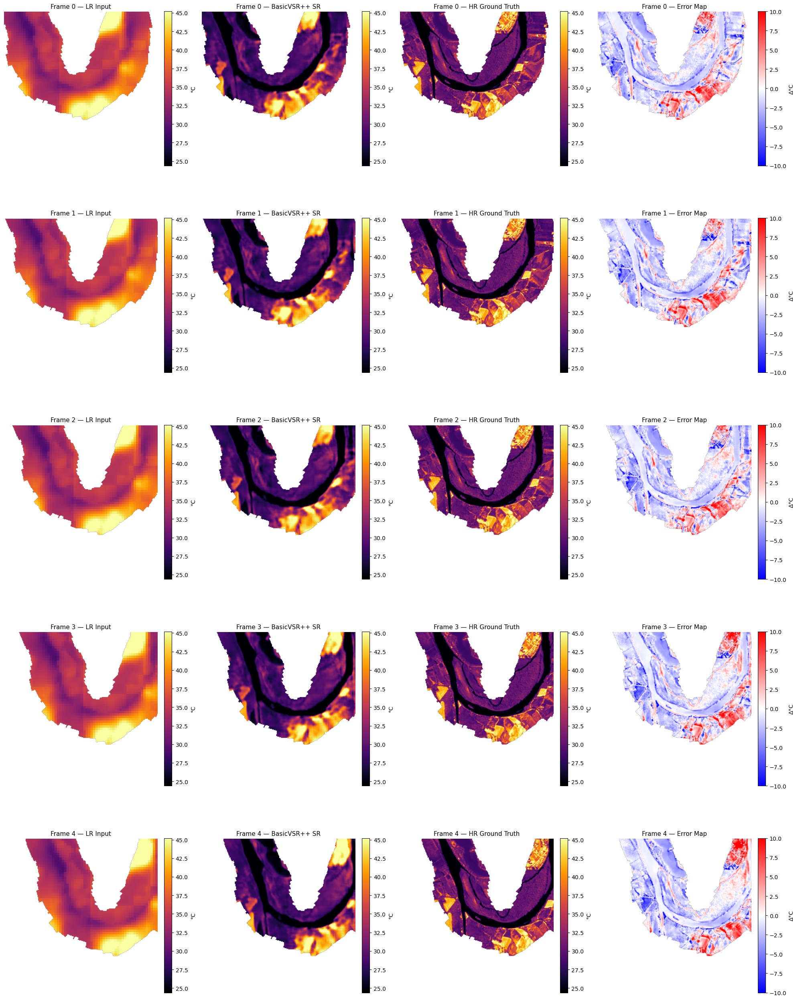

In [ ]:
sample_idx = 700 #700
sample = test_ds[sample_idx]

lr_seq_full = sample['lr']  # [5, 1, 64, 64]
sr_all = run_inference_all_frames(model, sample)  # [5, 256, 256]

# --- 1. Pre-process frames & compute global colorbar bounds ---
lr_masked_list = []
sr_masked_list = []
hr_masked_list = []
error_map_list = []

for f in range(5):
    hr_target = sample['hr'][f]
    mask_hr_np = sample['hr_mask'][f, 0, :, :].cpu().numpy()
    valid = mask_hr_np > 0.5

    sr_denorm = sr_all[f]
    hr_denorm = (hr_target[0, :, :].cpu().numpy() * HR_STD) + HR_MEAN

    lr_raw = lr_seq_full[f, 0, :, :].cpu().numpy()
    lr_denorm = lr_raw * LR_STD + LR_MEAN
    lr_256_denorm = np.repeat(np.repeat(lr_denorm, 4, axis=0), 4, axis=1)

    lr_m = np.where(valid, lr_256_denorm, np.nan)
    sr_m = np.where(valid, sr_denorm, np.nan)
    hr_m = np.where(valid, hr_denorm, np.nan)
    err_m = sr_m - hr_m

    lr_masked_list.append(lr_m)
    sr_masked_list.append(sr_m)
    hr_masked_list.append(hr_m)
    error_map_list.append(err_m)

# Compute global limits across the entire sequence
all_valid_hr = np.concatenate([h[np.isfinite(h)] for h in hr_masked_list])
all_valid_errors = np.concatenate([np.abs(e[np.isfinite(e)]) for e in error_map_list])

global_vmin = np.percentile(all_valid_hr, 1) if len(all_valid_hr) > 0 else 15.0
global_vmax = np.percentile(all_valid_hr, 99) if len(all_valid_hr) > 0 else 30.0

# Fixed symmetrical limit for the error map (e.g., 98th percentile or hardcoded limit)
global_err_max = np.percentile(all_valid_errors, 98) if len(all_valid_errors) > 0 else 10.0

# --- 2. Plotting loop with unified bounds ---
fig, axes = plt.subplots(5, 4, figsize=(20, 26))

for f in range(5):
    lr_masked = lr_masked_list[f]
    sr_masked = sr_masked_list[f]
    hr_masked = hr_masked_list[f]
    error_map = error_map_list[f]

    im0 = axes[f, 0].imshow(lr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 0].set_title(f"Frame {f} — LR Input", fontsize=11)
    plt.colorbar(im0, ax=axes[f, 0], fraction=0.046, pad=0.04, label="°C")
    axes[f, 0].axis('off')

    im1 = axes[f, 1].imshow(sr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 1].set_title(f"Frame {f} — BasicVSR++ SR", fontsize=11)
    plt.colorbar(im1, ax=axes[f, 1], fraction=0.046, pad=0.04, label="°C")
    axes[f, 1].axis('off')

    im2 = axes[f, 2].imshow(hr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 2].set_title(f"Frame {f} — HR Ground Truth", fontsize=11)
    plt.colorbar(im2, ax=axes[f, 2], fraction=0.046, pad=0.04, label="°C")
    axes[f, 2].axis('off')

    # Fixed error bounds prevent low-error frames from appearing falsely extreme
    im3 = axes[f, 3].imshow(error_map, cmap='bwr', vmin=-5, vmax=5)
    axes[f, 3].set_title(f"Frame {f} — Error Map", fontsize=11)
    plt.colorbar(im3, ax=axes[f, 3], fraction=0.046, pad=0.04, label="Δ°C")
    axes[f, 3].axis('off')

plt.tight_layout()
plt.show()

In [16]:
# METRICS FOR THIS SPECIFIC SEQUENCE
frame_maes = []
frame_rmses = []

for f in range(5):
    # Retrieve the masked error map for frame f (SR - HR in °C)
    err = error_map_list[f]
    
    # Extract only valid water pixels (ignoring background NaNs)
    valid_err = err[np.isfinite(err)]
    
    # MAE and RMSE for this frame
    mae_f = np.mean(np.abs(valid_err))
    rmse_f = np.sqrt(np.mean(valid_err ** 2))
    
    frame_maes.append(mae_f)
    frame_rmses.append(rmse_f)

# Average across the 5 frames -> Per-Sequence Metrics
seq_mae = np.mean(frame_maes)
seq_rmse = np.mean(frame_rmses)

# --- PRINT SUMMARY ---
print(f" METRICS FOR SAMPLE {sample_idx}")
print(f"  Sequence Avg MAE:  {seq_mae:.4f} °C")
print(f"  Sequence Avg RMSE: {seq_rmse:.4f} °C")
print(" Frame-by-Frame Breakdown:")
for f in range(5):
    print(f"   Frame {f} -> MAE: {frame_maes[f]:.4f} °C | RMSE: {frame_rmses[f]:.4f} °C")

 METRICS FOR SAMPLE 0
  Sequence Avg MAE:  1.7599 °C
  Sequence Avg RMSE: 2.4235 °C
 Frame-by-Frame Breakdown:
   Frame 0 -> MAE: 1.7692 °C | RMSE: 2.4426 °C
   Frame 1 -> MAE: 1.7427 °C | RMSE: 2.3867 °C
   Frame 2 -> MAE: 1.7478 °C | RMSE: 2.4057 °C
   Frame 3 -> MAE: 1.7612 °C | RMSE: 2.4095 °C
   Frame 4 -> MAE: 1.7788 °C | RMSE: 2.4731 °C


#### SPADE

In [ ]:
# test metrics
from lightning.pytorch import Trainer
from torch.utils.data import DataLoader
# from scripts.utils.seq_dataset import SRSequenceDataset

# PATCHES_DIR = BASE / "data/processed/seq_patches2"
# STATS_PATH = BASE / "data/processed/patches/stats.json"

# test_ds = SRSequenceDataset("test", PATCHES_DIR, STATS_PATH)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=6, pin_memory=True)

trainer = Trainer(accelerator="gpu", devices=1, precision="bf16-mixed", logger=False)
results = trainer.test(model, test_loader)
# print(results)

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /share/home/e2406751/.conda/envs/sisr/lib/python3.11 ...
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
You are using a CUDA device ('NVIDIA RTX 5000 Ada Generation') that has Tensor Core

Output()

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torch/functional.py:534: UserWarning: 
torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at
../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torchmetrics/functional/image/lpips.py:332: 
FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the 
default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary 
code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more 
details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 
functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via 
this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We 
recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded 
file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location="cpu"), strict=False)

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/land_lpips      │    0.5240074992179871     │
│       test/land_mae       │     4.163782119750977     │
│      test/land_psnr       │    15.232039451599121     │
│      test/land_rmse       │     5.08563232421875      │
│      test/land_ssim       │     0.462063193321228     │
│     test/water_lpips      │    0.5045329928398132     │
│      test/water_mae       │    1.9742138385772705     │
│      test/water_psnr      │    20.838333129882812     │
│      test/water_rmse      │    2.6549630165100098     │
│      test/water_ssim      │    0.4766411781311035     │
└───────────────────────────┴───────────────────────────┘

In [4]:
def run_inference_all_frames(model, sample):
    lr_seq = sample["lr"]      # [5, 1, 64, 64]
    aux_seq = sample.get("aux")  # [5, 25, 64, 64] or None
    aux_mid = sample.get("aux_mid")  # [5, 25, 64, 64] or None
    aux_hr = sample.get("aux_hr")  # [5, 25, 256, 256] or None

    lr_input = lr_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype)   # [1, 5, 1, 64, 64]
    aux_input = aux_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_seq is not None else None
    aux_mid = aux_mid.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_mid is not None else None
    aux_hr = aux_hr.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_hr is not None else None

    with torch.no_grad():
        sr_seq = model(lr_input, aux_input, aux_mid, aux_hr)   # calls BasicVSRModule.forward -> self.model(lr_seq, aux_seq)

    sr_all = sr_seq[0, :, 0, :, :].detach().cpu().float().numpy()
    return sr_all * HR_STD + HR_MEAN

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


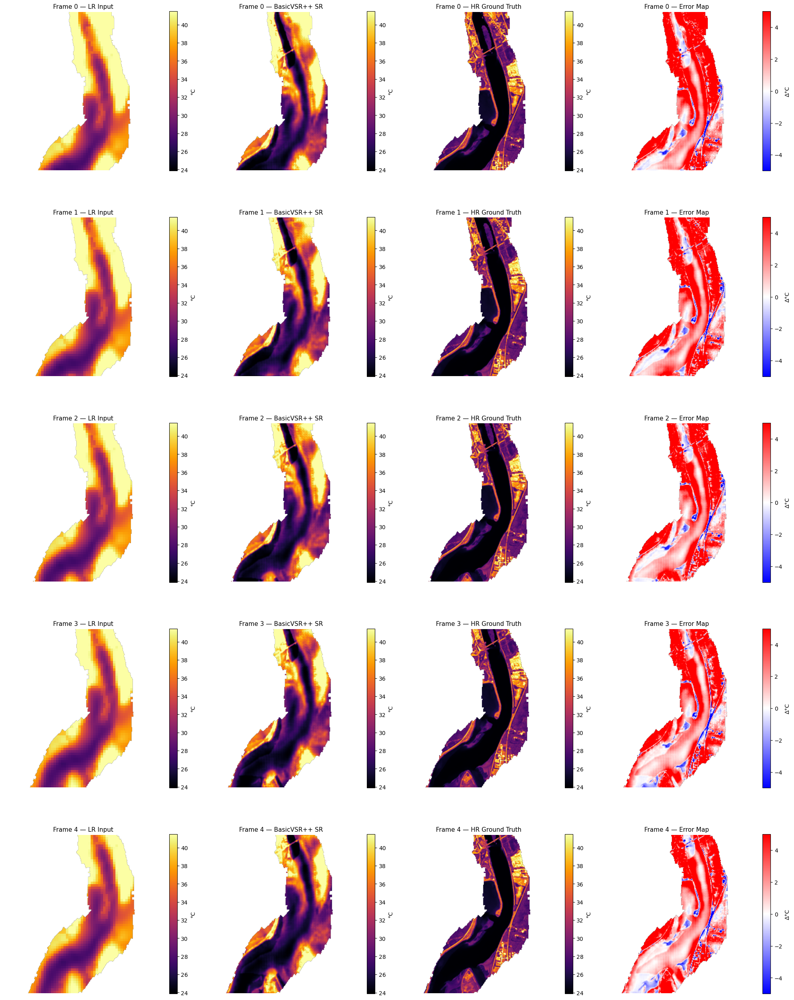

In [6]:
sample_idx = 247 
sample = test_ds[sample_idx]

lr_seq_full = sample['lr']  # [5, 1, 64, 64]
sr_all = run_inference_all_frames(model, sample)  # [5, 256, 256]

# --- 1. Pre-process frames & compute global colorbar bounds ---
lr_masked_list = []
sr_masked_list = []
hr_masked_list = []
error_map_list = []

for f in range(5):
    hr_target = sample['hr'][f]
    mask_hr_np = sample['hr_mask'][f, 0, :, :].cpu().numpy()
    valid = mask_hr_np > 0.5

    sr_denorm = sr_all[f]
    hr_denorm = (hr_target[0, :, :].cpu().numpy() * HR_STD) + HR_MEAN

    lr_raw = lr_seq_full[f, 0, :, :].cpu().numpy()
    lr_denorm = lr_raw * LR_STD + LR_MEAN
    lr_256_denorm = np.repeat(np.repeat(lr_denorm, 4, axis=0), 4, axis=1)

    lr_m = np.where(valid, lr_256_denorm, np.nan)
    sr_m = np.where(valid, sr_denorm, np.nan)
    hr_m = np.where(valid, hr_denorm, np.nan)
    err_m = sr_m - hr_m

    lr_masked_list.append(lr_m)
    sr_masked_list.append(sr_m)
    hr_masked_list.append(hr_m)
    error_map_list.append(err_m)

# Compute global limits across the entire sequence
all_valid_hr = np.concatenate([h[np.isfinite(h)] for h in hr_masked_list])
all_valid_errors = np.concatenate([np.abs(e[np.isfinite(e)]) for e in error_map_list])

global_vmin = np.percentile(all_valid_hr, 1) if len(all_valid_hr) > 0 else 15.0
global_vmax = np.percentile(all_valid_hr, 99) if len(all_valid_hr) > 0 else 30.0

# Fixed symmetrical limit for the error map (e.g., 98th percentile or hardcoded limit)
global_err_max = np.percentile(all_valid_errors, 98) if len(all_valid_errors) > 0 else 10.0

# --- 2. Plotting loop with unified bounds ---
fig, axes = plt.subplots(5, 4, figsize=(20, 26))

for f in range(5):
    lr_masked = lr_masked_list[f]
    sr_masked = sr_masked_list[f]
    hr_masked = hr_masked_list[f]
    error_map = error_map_list[f]

    im0 = axes[f, 0].imshow(lr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 0].set_title(f"Frame {f} — LR Input", fontsize=11)
    plt.colorbar(im0, ax=axes[f, 0], fraction=0.046, pad=0.04, label="°C")
    axes[f, 0].axis('off')

    im1 = axes[f, 1].imshow(sr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 1].set_title(f"Frame {f} — BasicVSR++ SR", fontsize=11)
    plt.colorbar(im1, ax=axes[f, 1], fraction=0.046, pad=0.04, label="°C")
    axes[f, 1].axis('off')

    im2 = axes[f, 2].imshow(hr_masked, cmap='inferno', vmin=global_vmin, vmax=global_vmax)
    axes[f, 2].set_title(f"Frame {f} — HR Ground Truth", fontsize=11)
    plt.colorbar(im2, ax=axes[f, 2], fraction=0.046, pad=0.04, label="°C")
    axes[f, 2].axis('off')

    # Fixed error bounds prevent low-error frames from appearing falsely extreme
    im3 = axes[f, 3].imshow(error_map, cmap='bwr', vmin=-5, vmax=5)
    axes[f, 3].set_title(f"Frame {f} — Error Map", fontsize=11)
    plt.colorbar(im3, ax=axes[f, 3], fraction=0.046, pad=0.04, label="Δ°C")
    axes[f, 3].axis('off')

plt.tight_layout()
plt.show()

In [18]:
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches

sample_idx = 20  
sample = test_ds[sample_idx]

seq_entry = test_ds.sequences[sample_idx]
frame_ids = seq_entry["frame_ids"]
print(seq_entry)   # confirm campaign/sequence_name for the new pick

# rerun BasicVSR++ inference for this sequence
sr_all = run_inference_all_frames(model, sample)

# rebuild lr/hr/error masked lists (your existing preprocessing block)
lr_masked_list, sr_masked_list, hr_masked_list, error_map_list = [], [], [], []
for f in range(5):
    hr_target = sample['hr'][f]
    mask_hr_np = sample['hr_mask'][f, 0, :, :].cpu().numpy()
    valid = mask_hr_np > 0.5

    sr_denorm = sr_all[f]
    hr_denorm = (hr_target[0, :, :].cpu().numpy() * HR_STD) + HR_MEAN
    lr_raw = sample['lr'][f, 0, :, :].cpu().numpy()
    lr_denorm = lr_raw * LR_STD + LR_MEAN
    lr_256_denorm = np.repeat(np.repeat(lr_denorm, 4, axis=0), 4, axis=1)

    lr_masked_list.append(np.where(valid, lr_256_denorm, np.nan))
    sr_masked_list.append(np.where(valid, sr_denorm, np.nan))
    hr_masked_list.append(np.where(valid, hr_denorm, np.nan))

seq_sr_masked_list = sr_masked_list  # naming alias used in the figures

# recompute global color limits for the new sequence
all_valid_hr = np.concatenate([h[np.isfinite(h)] for h in hr_masked_list])
global_vmin = np.percentile(all_valid_hr, 1)
global_vmax = np.percentile(all_valid_hr, 99)

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import numpy as np
import torch

# ═══════════════════════════════════════════════════════════════════
# 0. Run independent SISR (SPADE) inference on each frame
# ═══════════════════════════════════════════════════════════════════
from scripts.models.realesrgan import RealESRGANModule
MODEL_PATH  = str(BASE / "checkpoints/gan_final/exp_1784030832_epoch=47_val_water_mae=0.9792.ckpt")
spade_model = RealESRGANModule.load_from_checkpoint(MODEL_PATH, strict=False).to(device).eval()

sisr_masked_list = []

for i, fid in enumerate(frame_ids):
    frame_idx_i = int(fid.replace("f", ""))

    lr = test_ds.lr_data[frame_idx_i].astype(np.float32)
    lr_mask = np.isfinite(lr).astype(np.float32)
    lr = np.where(lr_mask, lr, test_ds.lr_mean)
    lr_norm = (lr - test_ds.lr_mean) / test_ds.lr_std

    aux_lr_raw = test_ds.aux_data[frame_idx_i].astype(np.float32)   # [23, 64, 64], raw, no time concat
    aux_mid    = test_ds.aux_mid_data[frame_idx_i].astype(np.float32)
    aux_hr     = test_ds.aux_hr_data[frame_idx_i].astype(np.float32)

    meta = test_ds.frame_metadata.get(fid, {})
    time_gap_hours = float(meta.get("time_gap_hours", 0.0))
    date_gap_days  = float(meta.get("date_gap_days", 0.0))
    H, W = aux_lr_raw.shape[-2], aux_lr_raw.shape[-1]
    time_channels = np.stack([
        np.full((H, W), time_gap_hours / 24.0, dtype=np.float32),
        np.full((H, W), date_gap_days / 365.0, dtype=np.float32),
    ], axis=0)

    batch = {
        "lr":            torch.from_numpy(lr_norm).float()[None, None].to(device),
        "aux_lr":        torch.from_numpy(aux_lr_raw).float()[None].to(device),
        "aux_mid":       torch.from_numpy(aux_mid).float()[None].to(device),
        "aux_hr":        torch.from_numpy(aux_hr).float()[None].to(device),
        "time_channels": torch.from_numpy(time_channels).float()[None].to(device),
    }

    with torch.no_grad():
        sr = spade_model(batch)
    sr_phys = spade_model.denormalize(sr).squeeze().cpu().numpy()

    hr_i = test_ds.hr_data[frame_idx_i].astype(np.float32)
    valid = np.isfinite(hr_i)
    sisr_masked_list.append(np.where(valid, sr_phys, np.nan))

    print(f"[{i+1}/5] {fid} (frame_idx={frame_idx_i}) SISR done")


{'sequence_name': 'BRC_2022_b0_s0000436', 'split': 'test', 'campaign': 'BRC_2022', 'block_id': 0, 'frame_ids': ['f00002180', 'f00002181', 'f00002182', 'f00002183', 'f00002184']}
[INFO] generator loaded 702 params
[INFO] discriminator loaded 28 params
[1/5] f00002180 (frame_idx=2180) SISR done
[2/5] f00002181 (frame_idx=2181) SISR done
[3/5] f00002182 (frame_idx=2182) SISR done
[4/5] f00002183 (frame_idx=2183) SISR done
[5/5] f00002184 (frame_idx=2184) SISR done


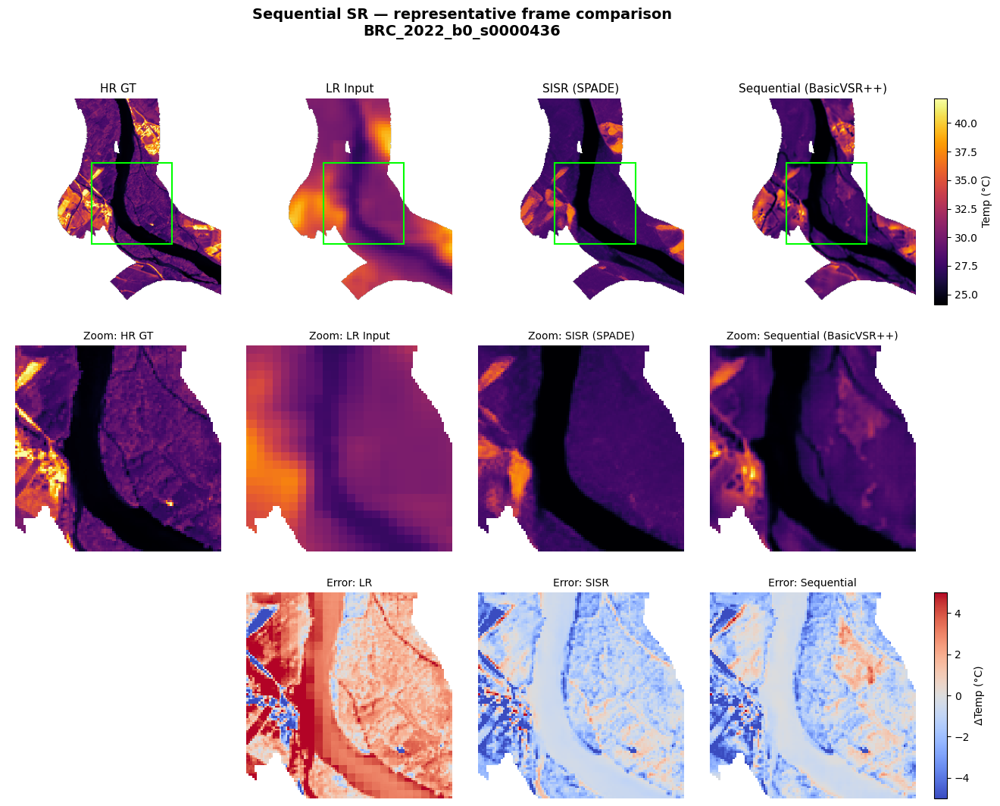

In [19]:
frame_idx = 2  # middle frame

x, y, w, h = 95, 80, 100, 100
row_slice = slice(y, y + h)
col_slice = slice(x, x + w)

def add_zoom_box(ax, x, y, w, h, color="lime", lw=1.5):
    ax.add_patch(mpatches.Rectangle((x, y), w, h, linewidth=lw,
                                     edgecolor=color, facecolor="none"))

COL_LABELS = ["HR GT", "LR Input", "SISR (SPADE)", "Sequential (BasicVSR++)"]
full_panels = [hr_masked_list[frame_idx], lr_masked_list[frame_idx],
               sisr_masked_list[frame_idx], seq_sr_masked_list[frame_idx]]

lr_error   = lr_masked_list[frame_idx] - hr_masked_list[frame_idx]
sisr_error = sisr_masked_list[frame_idx] - hr_masked_list[frame_idx]
seq_error  = seq_sr_masked_list[frame_idx] - hr_masked_list[frame_idx]

fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(3, 5, width_ratios=[1,1,1,1,0.06],
                        hspace=0.2, wspace=0.06, figure=fig)
fig.suptitle(f"Sequential SR — representative frame comparison\n{sample.get('spatial_key', '')}",
             fontsize=14, fontweight="bold")

# Row 0: full patches
for c, (label, arr) in enumerate(zip(COL_LABELS, full_panels)):
    ax = fig.add_subplot(gs[0, c])
    temp_im = ax.imshow(arr, cmap="inferno", vmin=global_vmin, vmax=global_vmax)
    ax.set_title(label, fontsize=11)
    ax.axis("off")
    add_zoom_box(ax, x, y, w, h)
fig.colorbar(temp_im, cax=fig.add_subplot(gs[0, 4]), label="Temp (°C)")

# Row 1: zoomed crops
for c, (label, arr) in enumerate(zip(COL_LABELS, full_panels)):
    ax = fig.add_subplot(gs[1, c])
    ax.imshow(arr[row_slice, col_slice], cmap="inferno",
              vmin=global_vmin, vmax=global_vmax, interpolation="nearest")
    ax.set_title(f"Zoom: {label}", fontsize=10)
    ax.axis("off")

# Row 2: error maps — now under LR, SISR, and Sequential (blank under HR only)
fig.add_subplot(gs[2, 0]).axis("off")   # blank under HR
error_labels = ["Error: LR", "Error: SISR", "Error: Sequential"]
error_maps   = [lr_error, sisr_error, seq_error]
for c, (label, err) in enumerate(zip(error_labels, error_maps)):
    ax = fig.add_subplot(gs[2, 1 + c])
    err_im = ax.imshow(err[row_slice, col_slice], cmap="coolwarm",
                        vmin=-5, vmax=5, interpolation="nearest")
    ax.set_title(label, fontsize=10)
    ax.axis("off")
fig.colorbar(err_im, cax=fig.add_subplot(gs[2, 4]), label="ΔTemp (°C)")

# plt.savefig("seq_frame.png", dpi=600, bbox_inches="tight")
plt.show()

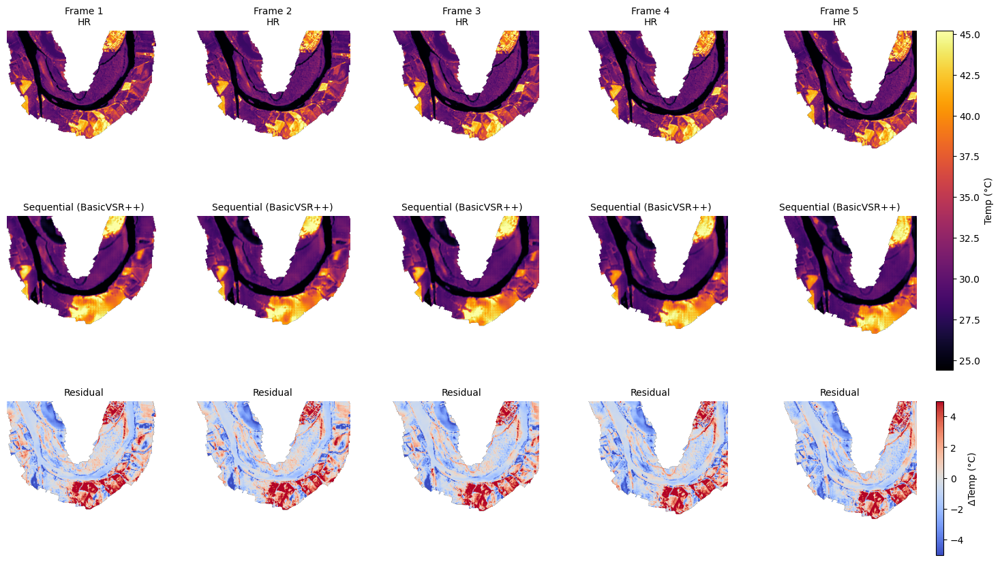

In [9]:
FRAME_IDXS = [0, 1, 2, 3, 4]
FRAME_LABELS = ["Frame 1", "Frame 2", "Frame 3", "Frame 4", "Frame 5"]
ROW_LABELS = ["HR", "Sequential (BasicVSR++)", "Error"]

fig, axes = plt.subplots(3, len(FRAME_IDXS), figsize=(18, 10))

for col, (fidx, flabel) in enumerate(zip(FRAME_IDXS, FRAME_LABELS)):
    hr_arr  = hr_masked_list[fidx]
    seq_arr = seq_sr_masked_list[fidx]
    err_arr = seq_arr - hr_arr

    # Row 0: HR
    ax = axes[0, col]
    temp_im = ax.imshow(hr_arr, cmap="inferno", vmin=global_vmin, vmax=global_vmax)
    ax.set_title(f"{flabel}\nHR", fontsize=10)
    ax.axis("off")

    # Row 1: Sequential SR
    ax = axes[1, col]
    ax.imshow(seq_arr, cmap="inferno", vmin=global_vmin, vmax=global_vmax)
    ax.set_title("Sequential (BasicVSR++)", fontsize=10)
    ax.axis("off")

    # Row 2: Error map
    ax = axes[2, col]
    err_im = ax.imshow(err_arr, cmap="coolwarm", vmin=-5, vmax=5)
    ax.set_title("Residual", fontsize=10)
    ax.axis("off")

fig.colorbar(temp_im, ax=axes[:2, :], fraction=0.02, pad=0.02, label="Temp (°C)")
fig.colorbar(err_im, ax=axes[2, :], fraction=0.02, pad=0.02, label="ΔTemp (°C)")

# plt.savefig("seq_progressive.png", dpi=600, bbox_inches="tight")
plt.show()

In [9]:
# METRICS FOR THIS SPECIFIC SEQUENCE
frame_maes = []
frame_rmses = []

for f in range(5):
    # Retrieve the masked error map for frame f (SR - HR in °C)
    err = error_map_list[f]
    
    # Extract only valid water pixels (ignoring background NaNs)
    valid_err = err[np.isfinite(err)]
    
    # MAE and RMSE for this frame
    mae_f = np.mean(np.abs(valid_err))
    rmse_f = np.sqrt(np.mean(valid_err ** 2))
    
    frame_maes.append(mae_f)
    frame_rmses.append(rmse_f)

# Average across the 5 frames -> Per-Sequence Metrics
seq_mae = np.mean(frame_maes)
seq_rmse = np.mean(frame_rmses)

# --- PRINT SUMMARY ---
print(f" METRICS FOR SAMPLE {sample_idx}")
print(f"  Sequence Avg MAE:  {seq_mae:.4f} °C")
print(f"  Sequence Avg RMSE: {seq_rmse:.4f} °C")
print(" Frame-by-Frame Breakdown:")
for f in range(5):
    print(f"   Frame {f} -> MAE: {frame_maes[f]:.4f} °C | RMSE: {frame_rmses[f]:.4f} °C")

 METRICS FOR SAMPLE 0
  Sequence Avg MAE:  1.2584 °C
  Sequence Avg RMSE: 1.8542 °C
 Frame-by-Frame Breakdown:
   Frame 0 -> MAE: 1.2027 °C | RMSE: 1.7615 °C
   Frame 1 -> MAE: 1.2517 °C | RMSE: 1.8122 °C
   Frame 2 -> MAE: 1.2510 °C | RMSE: 1.8362 °C
   Frame 3 -> MAE: 1.2776 °C | RMSE: 1.9120 °C
   Frame 4 -> MAE: 1.3089 °C | RMSE: 1.9489 °C


#### CDF

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Non-overlapping frame selection (avoid double-counting overlap)
def select_non_overlapping_frames(frame_metadata, tile_size=256, extraction_stride_px=13):
    groups = defaultdict(list)
    for fid, meta in frame_metadata.items():
        key = (meta["campaign"], meta.get("block_id"))
        groups[key].append((meta["frame_idx"], fid))

    step = max(1, tile_size // extraction_stride_px)
    selected = set()
    for entries in groups.values():
        entries.sort(key=lambda x: x[0])
        for i in range(0, len(entries), step):
            selected.add(entries[i][1])
    return selected


# Deduplicated water pixel extraction
import torch
from torch.utils.data import DataLoader, Subset

def build_filtered_loader(dataset, allowed_fids, batch_size=8, num_workers=4):
    """
    Pre-filter to only sequences containing at least one allowed_fid,
    then wrap in a DataLoader for batched (not per-sample) inference.
    """
    keep_indices = [
        idx for idx, seq in enumerate(dataset.sequences)
        if any(fid in allowed_fids for fid in seq["frame_ids"])
    ]
    print(f"[INFO] Keeping {len(keep_indices)}/{len(dataset)} sequences after frame filtering")
    subset = Subset(dataset, keep_indices)
    return DataLoader(subset, batch_size=batch_size, shuffle=False,
                       num_workers=num_workers, pin_memory=True)


def extract_pure_water_pixels_dedup_fast(dataset, model, allowed_fids, frame_indices=range(5),
                                          batch_size=8, num_workers=4):
    loader = build_filtered_loader(dataset, allowed_fids, batch_size=batch_size, num_workers=num_workers)

    frame_sr_preds = defaultdict(list)
    frame_hr, frame_lr, frame_mask = {}, {}, {}

    model.eval()
    n_batches = len(loader)

    with torch.no_grad():
        for b_idx, batch in enumerate(loader):
            lr = batch["lr"].to(device=model.device, dtype=model.dtype)
            aux = batch.get("aux")
            aux = aux.to(device=model.device, dtype=model.dtype) if (aux is not None and model.use_aux) else None

            sr_seq = model(lr, aux)
            sr_batch = (sr_seq[:, :, 0, :, :].cpu().numpy() * HR_STD) + HR_MEAN

            hr_batch = (batch["hr"][:, :, 0, :, :].numpy() * HR_STD) + HR_MEAN
            hr_mask_batch = batch["hr_mask"][:, :, 0, :, :].numpy()
            water_mask_batch = batch["water_mask"][:, :, 0, :, :].numpy()
            lr_batch = batch["lr"][:, :, 0, :, :].numpy()
            frame_ids_batch = batch["frame_ids"]   # actual shape: [T][B], not [B][T]

            B = lr_batch.shape[0]
            for bi in range(B):
                for f in frame_indices:
                    fid = frame_ids_batch[f][bi]     # <<< CHANGED: was frame_ids_batch[bi][f]
                    if fid not in allowed_fids:
                        continue

                    pure_water = (hr_mask_batch[bi, f] > 0.5) & (water_mask_batch[bi, f] > 0.5)
                    if pure_water.sum() < 10:
                        continue

                    sr_np = np.nan_to_num(sr_batch[bi, f], nan=0.0)
                    frame_sr_preds[fid].append(sr_np)

                    if fid not in frame_hr:
                        hr_np = hr_batch[bi, f]
                        lr_up = np.repeat(np.repeat(lr_batch[bi, f] * LR_STD + LR_MEAN, 4, axis=0), 4, axis=1)
                        frame_hr[fid] = hr_np
                        frame_lr[fid] = lr_up
                        frame_mask[fid] = pure_water

            if (b_idx + 1) % 50 == 0:
                print(f"  Processed batch {b_idx + 1}/{n_batches}")

    all_hr, all_lr, all_sr = [], [], []
    for fid, sr_list in frame_sr_preds.items():
        sr_avg = np.mean(np.stack(sr_list, axis=0), axis=0)
        m = frame_mask[fid]
        all_hr.append(frame_hr[fid][m])
        all_lr.append(frame_lr[fid][m])
        all_sr.append(sr_avg[m])

    print(f"[INFO] Unique frame_ids used: {len(frame_sr_preds)}")
    return np.concatenate(all_hr), np.concatenate(all_lr), np.concatenate(all_sr)

# CDF + Histogram + Scatter
def plot_water_distributions(hr_v, lr_v, sr_v, n_scatter_samples=200_000):
    fig, axes = plt.subplots(1, 3, figsize=(21, 6))
    palette = {"HR": "blue", "LR": "red", "SR": "green"}

    # --- CDF (full data, no thinning needed unless it's slow to render) ---
    ax_cdf = axes[0]
    for vec, key, lbl in [(hr_v, "HR", "Target (HR)"), (lr_v, "LR", "Input (LR)"), (sr_v, "SR", "Predicted (SR)")]:
        sorted_data = np.sort(vec)
        y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
        ax_cdf.plot(sorted_data, y, color=palette[key], lw=2.5, label=lbl)
    ax_cdf.set_title("Water CDF", fontsize=12, fontweight="bold")
    ax_cdf.set_xlabel("Temperature (°C)")
    ax_cdf.set_ylabel("Cumulative Probability")
    xmin = np.percentile(hr_v, 1) - 1.0
    xmax = np.percentile(lr_v, 99) + 1.0
    ax_cdf.set_xlim(xmin, xmax)
    ax_cdf.grid(True, alpha=0.3)
    ax_cdf.legend(loc="upper left")

    # --- Histogram ---
    ax_hist = axes[1]
    bins = np.linspace(xmin, xmax, 80)
    for vec, key, lbl in [(hr_v, "HR", "Target (HR)"), (lr_v, "LR", "Input (LR)"), (sr_v, "SR", "Predicted (SR)")]:
        ax_hist.hist(vec, bins=bins, color=palette[key], alpha=0.45, label=lbl, density=True)
    ax_hist.set_title("Water Temperature Histogram", fontsize=12, fontweight="bold")
    ax_hist.set_xlabel("Temperature (°C)")
    ax_hist.set_ylabel("Density")
    ax_hist.grid(True, alpha=0.3)
    ax_hist.legend(loc="upper right")

    # --- Scatter (subsampled for rendering only) ---
    n_total = len(hr_v)
    if n_total > n_scatter_samples:
        idx = np.random.default_rng(42).choice(n_total, size=n_scatter_samples, replace=False)
        hr_s, sr_s = hr_v[idx], sr_v[idx]
    else:
        hr_s, sr_s = hr_v, sr_v

    ax_scat = axes[2]
    hb = ax_scat.hexbin(hr_s, sr_s, gridsize=100, cmap="RdYlBu_r", mincnt=1, bins='log')
    gmin, gmax = min(hr_s.min(), sr_s.min()), max(hr_s.max(), sr_s.max())
    ax_scat.plot([gmin, gmax], [gmin, gmax], "r--", lw=1.5, label="1:1 Match")
    ax_scat.set_title("SR vs HR ", fontsize=12, fontweight="bold")
    ax_scat.set_xlabel("HR Temperature (°C)")
    ax_scat.set_ylabel("SR Temperature (°C)")
    ax_scat.set_aspect("equal")
    ax_scat.grid(True, alpha=0.3)
    fig.colorbar(hb, ax=ax_scat, label="Log10(Pixel Count)")
    # ax_scat.legend(loc="upper right")

    plt.tight_layout()
    plt.show()

baseline

[INFO] Keeping 191/723 sequences after frame filtering
[INFO] Unique frame_ids used: 191


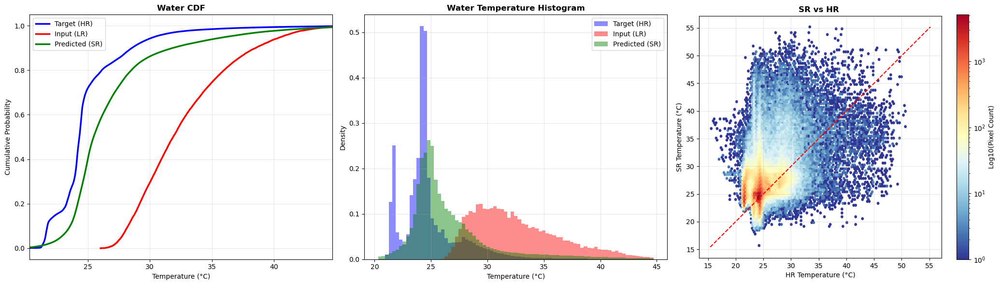

In [15]:
with open(PATCHES_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)

non_overlapping_fids = select_non_overlapping_frames(frame_metadata)
hr_v, lr_v, sr_v = extract_pure_water_pixels_dedup_fast(test_ds, model, allowed_fids=non_overlapping_fids)
plot_water_distributions(hr_v, lr_v, sr_v)

aux input

[INFO] Keeping 191/723 sequences after frame filtering


[INFO] Unique frame_ids used: 191


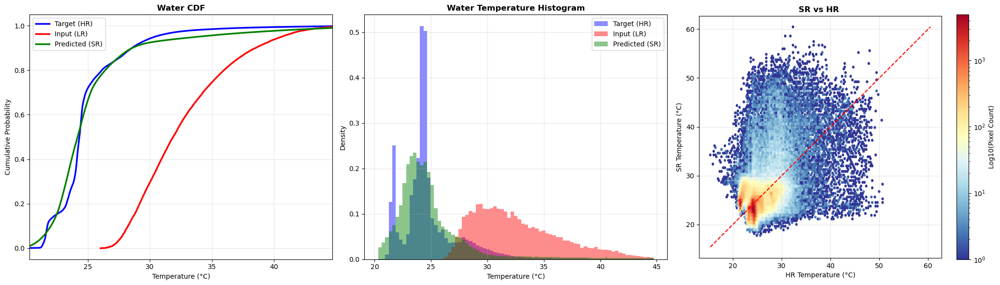

In [18]:
# run its inference function first
with open(PATCHES_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)

non_overlapping_fids = select_non_overlapping_frames(frame_metadata)
hr_v, lr_v, sr_v = extract_pure_water_pixels_dedup_fast(test_ds, model, allowed_fids=non_overlapping_fids)
plot_water_distributions(hr_v, lr_v, sr_v)

SPADE

[INFO] Keeping 191/723 sequences after frame filtering
[INFO] Unique frame_ids used: 191


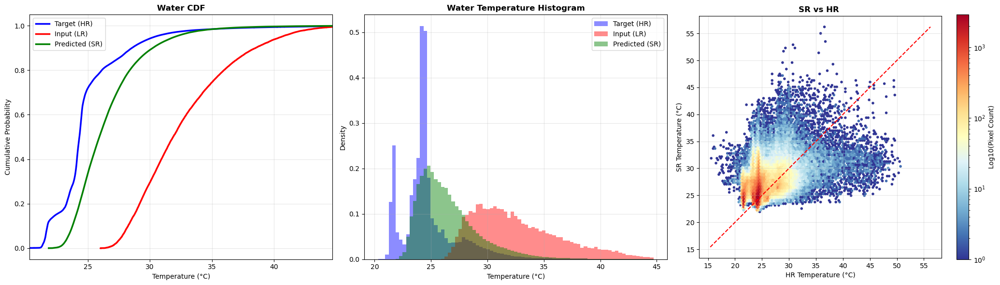

In [11]:
# run its inference function first
with open(PATCHES_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)

non_overlapping_fids = select_non_overlapping_frames(frame_metadata)
hr_v, lr_v, sr_v = extract_pure_water_pixels_dedup_fast(test_ds, model, allowed_fids=non_overlapping_fids)
plot_water_distributions(hr_v, lr_v, sr_v)

### Longitudinal profile

Loaded 13825 frames, 2765 sequences
SISR test patches for HAUT_2025: 48
HR raster shape: (5787, 4490)
Water mask shape: (5787, 4490)
Frames covered by sequential data: 2380
TIF crop mean: 30.81 | Patch file mean: 30.81
^ these should be close/similar if coordinate systems agree


SISR coverage: 3145728 px
Sequential coverage: 2015447 px
Overlap (both): 1635446 px
Overlap as % of sequential: 81.1%


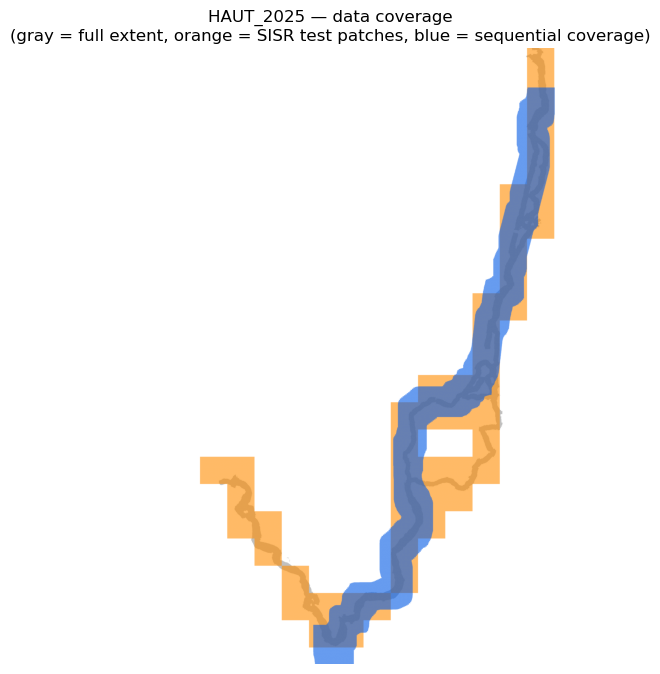

In [4]:
import re
import rasterio
from rasterio.transform import rowcol
import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path

CAMPAIGN = "HAUT_2025"
TIF_PATH = f"/share/home/e2406751/Superresolution-TIR/data/HR_downsampled/HAUT_2025.tif"
WATER_MASK_TIF = f"/share/home/e2406751/Superresolution-TIR/data/AUX/water_masks/HAUT_2025_water_mask.tif"  

# ── Seq metadata ──────────────────────────────────────────────────────
PATCHES_DIR = Path("/share/home/e2406751/Superresolution-TIR/data/processed/seq_patches2")
with open(PATCHES_DIR / "frame_metadata.json") as f:
    frame_metadata = json.load(f)
with open(PATCHES_DIR / "sequence_manifest.json") as f:
    sequence_manifest = json.load(f)
print(f"Loaded {len(frame_metadata)} frames, {len(sequence_manifest)} sequences")

# ── SISR metadata + patch offsets from filenames ────────────────────────
PATCHES_DIR_SISR = BASE / "data/processed/patches"
with open(PATCHES_DIR_SISR / "metadata.json") as f:
    patch_metadata = json.load(f)

sisr_test_dir = PATCHES_DIR_SISR / "test" / "HR"
sisr_campaign_files = [f.name for f in sisr_test_dir.glob(f"{CAMPAIGN}_*.npy")]
print(f"SISR test patches for {CAMPAIGN}: {len(sisr_campaign_files)}")

def parse_rc(fname):
    m = re.search(r"_r(\d+)_c(\d+)", fname)
    return int(m.group(1)), int(m.group(2))

sisr_offsets = {fname: parse_rc(fname) for fname in sisr_campaign_files}

# ── HR and Water mask raster ─────────────────────────────────────────────────────────
with rasterio.open(TIF_PATH) as src:
    hr_full = src.read(1).astype(np.float32)
    hr_full = np.where(hr_full == src.nodata, np.nan, hr_full)
    transform = src.transform
    print(f"HR raster shape: {hr_full.shape}")

with rasterio.open(WATER_MASK_TIF) as src:
    water_full = src.read(1)
    water_full = (water_full > 0.5) 
    print(f"Water mask shape: {water_full.shape}")


def bounds_to_pixel_window(bounds, transform):
    left, right = bounds["left"], bounds["right"]
    top, bottom = bounds["top"], bounds["bottom"]
    row_top, col_left = rowcol(transform, left, top)
    row_bot, col_right = rowcol(transform, right, bottom)
    return row_top, row_bot, col_left, col_right

# ── Sequential coverage (unchanged — from frame_metadata) ───────────────
campaign_seq_fids = set()
for seq in sequence_manifest:
    if seq["campaign"] == CAMPAIGN and seq["split"] == "test":
        campaign_seq_fids.update(seq["frame_ids"])
print(f"Frames covered by sequential data: {len(campaign_seq_fids)}")

seq_coverage = np.zeros_like(hr_full, dtype=bool)
for fid in campaign_seq_fids:
    r0, r1, c0, c1 = bounds_to_pixel_window(frame_metadata[fid]["bounds_2154"], transform)
    seq_coverage[r0:r1, c0:c1] = True

# ── SISR coverage — FIXED: from sisr_offsets (real filenames), not frame_metadata ──
SISR_PATCH_SIZE = 256  # adjust if your HR patch size differs

sisr_coverage = np.zeros_like(hr_full, dtype=bool)
for fname, (r0, c0) in sisr_offsets.items():
    r1 = min(r0 + SISR_PATCH_SIZE, hr_full.shape[0])
    c1 = min(c0 + SISR_PATCH_SIZE, hr_full.shape[1])
    sisr_coverage[r0:r1, c0:c1] = True

# ── Sanity check: do row/col from the filename actually line up with hr_full? ──
check_fname = sisr_campaign_files[0]
r0, c0 = sisr_offsets[check_fname]
tif_crop = hr_full[r0:r0+SISR_PATCH_SIZE, c0:c0+SISR_PATCH_SIZE]
patch_arr = np.load(sisr_test_dir / check_fname)
print(f"TIF crop mean: {np.nanmean(tif_crop):.2f} | Patch file mean: {np.nanmean(patch_arr):.2f}")
print("^ these should be close/similar if coordinate systems agree")

# ── Numeric coverage comparison ──────────────────────────────────────────
both_coverage = sisr_coverage & seq_coverage
print(f"SISR coverage: {sisr_coverage.sum()} px")
print(f"Sequential coverage: {seq_coverage.sum()} px")
print(f"Overlap (both): {both_coverage.sum()} px")
print(f"Overlap as % of sequential: {100 * both_coverage.sum() / seq_coverage.sum():.1f}%")

# ── Plot ──────────────────────────────────────────────────────────────
def make_rgba_overlay(mask, color_rgb, alpha=0.6):
    rgba = np.zeros((*mask.shape, 4))
    rgba[..., 0] = color_rgb[0]
    rgba[..., 1] = color_rgb[1]
    rgba[..., 2] = color_rgb[2]
    rgba[..., 3] = np.where(mask, alpha, 0.0)
    return rgba

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(np.isfinite(hr_full), cmap="gray_r", alpha=0.25)
ax.imshow(make_rgba_overlay(sisr_coverage, (1.0, 0.55, 0.0)))
ax.imshow(make_rgba_overlay(seq_coverage,  (0.0, 0.35, 0.9)))
ax.set_title(f"{CAMPAIGN} — data coverage\n(gray = full extent, orange = SISR test patches, blue = sequential coverage)")
ax.axis("off")
plt.show()

Endpoints found: 896
Centerline length: 6039 pixels


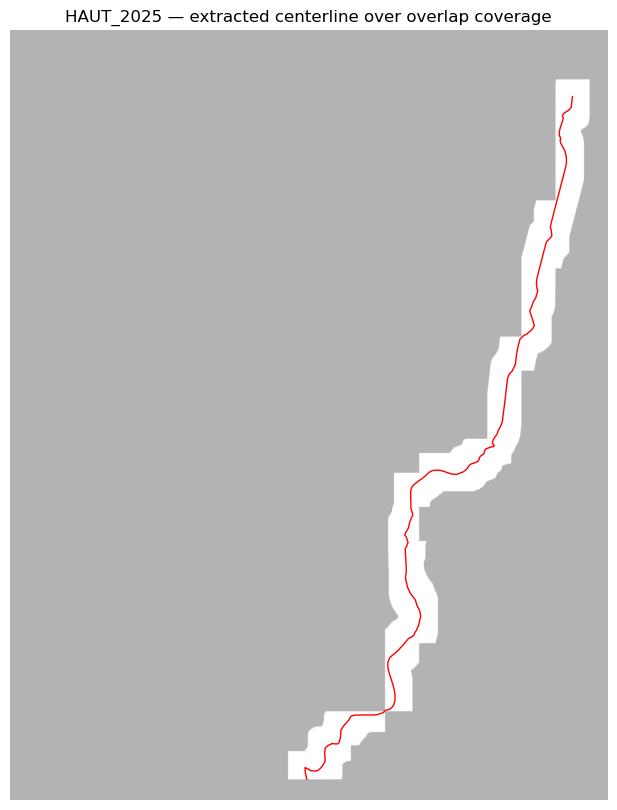

In [5]:
from skimage.morphology import skeletonize
import networkx as nx
from scipy.ndimage import gaussian_filter1d, map_coordinates

def extract_centerline(coverage_mask):
    skeleton = skeletonize(coverage_mask)
    ys, xs = np.where(skeleton)
    coord_set = set(zip(ys, xs))

    G = nx.Graph()
    for y, x in coord_set:
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                if (dy, dx) != (0, 0) and (y+dy, x+dx) in coord_set:
                    G.add_edge((y, x), (y+dy, x+dx))

    endpoints = [n for n in G.nodes if G.degree(n) == 1]
    print(f"Endpoints found: {len(endpoints)}")

    if len(endpoints) == 2:
        path = nx.shortest_path(G, source=endpoints[0], target=endpoints[1])
    else:
        longest = []
        for i in range(len(endpoints)):
            for j in range(i+1, len(endpoints)):
                try:
                    p = nx.shortest_path(G, source=endpoints[i], target=endpoints[j])
                    if len(p) > len(longest):
                        longest = p
                except nx.NetworkXNoPath:
                    continue
        path = longest

    cl_rows = np.array([p[0] for p in path], dtype=float)
    cl_cols = np.array([p[1] for p in path], dtype=float)

    # light smoothing to reduce skeleton pixel-staircase jitter
    cl_rows = gaussian_filter1d(cl_rows, sigma=2)
    cl_cols = gaussian_filter1d(cl_cols, sigma=2)

    return cl_rows, cl_cols

# both_coverage = sisr_coverage & seq_coverage
both_coverage_water = both_coverage & water_full
# cl_rows, cl_cols = extract_centerline(both_coverage)
cl_rows, cl_cols = extract_centerline(both_coverage_water)
print(f"Centerline length: {len(cl_rows)} pixels")

# visual check before sampling
fig, ax = plt.subplots(figsize=(8, 10))
ax.imshow(both_coverage, cmap="gray", alpha=0.3)
ax.plot(cl_cols, cl_rows, color="red", lw=1)
ax.set_title(f"{CAMPAIGN} — extracted centerline over overlap coverage")
ax.axis("off")
plt.show()

In [6]:
from scripts.models.realesrgan import RealESRGANModule
MODEL_PATH  = str(BASE / "checkpoints/gan_final/exp_1784030832_epoch=47_val_water_mae=0.9792.ckpt")
spade_model = RealESRGANModule.load_from_checkpoint(MODEL_PATH, strict=False).to(device).eval()

# build once, outside the loop — a dataset instance indexed by filename
from scripts.utils.dataset import SRDataset
sisr_test_ds = SRDataset(
    split="test",
    patches_dir=PATCHES_DIR_SISR,
    stats_path=PATCHES_DIR_SISR / "stats.json",
    use_aux=True,
    use_water_mask=True,
    aux_dir=str(PATCHES_DIR_SISR / "test" / "AUX"),
    transform=None,
)
# map filename -> dataset index, since __getitem__ takes an integer index
fname_to_idx = {f: i for i, f in enumerate(sisr_test_ds.files)}

def run_sisr_inference(model_obj, sample):
    batch = {
        "lr":             sample["lr"].unsqueeze(0).to(device),
        "aux_lr":         sample["aux_lr"].unsqueeze(0).to(device),
        "aux_mid":        sample["aux_mid"].unsqueeze(0).to(device),
        "aux_hr":         sample["aux_hr"].unsqueeze(0).to(device),
        "time_channels":  sample["time_channels"].unsqueeze(0).to(device),
    }
    with torch.no_grad():
        sr = model_obj(batch)
    return (sr[:, 0] * HR_STD + HR_MEAN).squeeze().cpu().numpy()

sisr_full = np.full_like(hr_full, np.nan)
for fname, (r0, c0) in sisr_offsets.items():
    r1 = min(r0 + SISR_PATCH_SIZE, hr_full.shape[0])
    c1 = min(c0 + SISR_PATCH_SIZE, hr_full.shape[1])

    sample = sisr_test_ds[fname_to_idx[fname]]
    sisr_pred = run_sisr_inference(spade_model, sample)   # [256, 256]

    # crop prediction to match the (possibly smaller, edge-clipped) destination window
    dest_h, dest_w = r1 - r0, c1 - c0
    sisr_full[r0:r1, c0:c1] = sisr_pred[:dest_h, :dest_w]

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/lightning/fabric/utilities/cloud_io.py:73: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


/share/home/e2406751/Superresolution-TIR/scripts/models/realesrgan.py:308: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(path, map_location="cpu")
/share/h

[INFO] generator loaded 702 params
[INFO] discriminator loaded 28 params


/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torchmetrics/functional/image/lpips.py:332: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_

In [7]:
def run_seq_inference(model, sample):
    lr_seq = sample["lr"]      # [5, 1, 64, 64]
    aux_seq = sample.get("aux")  # [5, 25, 64, 64] or None
    aux_mid = sample.get("aux_mid")  # [5, 25, 64, 64] or None
    aux_hr = sample.get("aux_hr")  # [5, 25, 256, 256] or None

    lr_input = lr_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype)   # [1, 5, 1, 64, 64]
    aux_input = aux_seq.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_seq is not None else None
    aux_mid = aux_mid.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_mid is not None else None
    aux_hr = aux_hr.unsqueeze(0).to(device=model.device, dtype=model.dtype) if aux_hr is not None else None

    with torch.no_grad():
        sr_seq = model(lr_input, aux_input, aux_mid, aux_hr)   # calls BasicVSRModule.forward -> self.model(lr_seq, aux_seq)

    sr_all = sr_seq[0, :, 0, :, :].detach().cpu().float().numpy()
    return sr_all * HR_STD + HR_MEAN


# map sequence-entry index by fid, since test_ds.sequences is indexed by position
fid_to_seq_idx = {}
for idx, seq_entry in enumerate(test_ds.sequences):
    for fid in seq_entry["frame_ids"]:
        fid_to_seq_idx[fid] = idx

seq_full_sum = np.zeros_like(hr_full)
seq_full_count = np.zeros_like(hr_full)

processed_seq_indices = set()
for fid in campaign_seq_fids:
    seq_idx = fid_to_seq_idx[fid]
    if seq_idx in processed_seq_indices:
        continue  # each sequence covers 5 frame_ids — only run inference once per sequence
    processed_seq_indices.add(seq_idx)

    sample = test_ds[seq_idx]
    sr_all = run_seq_inference(model, sample)   # model = your loaded BasicVSRModule

    for f_idx, frame_fid in enumerate(sample["frame_ids"]):
        r0, r1, c0, c1 = bounds_to_pixel_window(frame_metadata[frame_fid]["bounds_2154"], transform)
        r1 = min(r1, hr_full.shape[0])
        c1 = min(c1, hr_full.shape[1])

        pred = sr_all[f_idx]
        dest_h, dest_w = r1 - r0, c1 - c0
        pred_cropped = pred[:dest_h, :dest_w]

        valid = ~np.isnan(pred_cropped)
        seq_full_sum[r0:r1, c0:c1][valid] += pred_cropped[valid]
        seq_full_count[r0:r1, c0:c1][valid] += 1

seq_full = np.where(seq_full_count > 0, seq_full_sum / np.maximum(seq_full_count, 1), np.nan)

/share/home/e2406751/.conda/envs/sisr/lib/python3.11/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [8]:
import rasterio
import numpy as np

# grab crs (cheap — metadata only, doesn't re-read the full raster)
with rasterio.open(TIF_PATH) as src:
    crs = src.crs

def save_mosaic(path, array, transform, crs):
    with rasterio.open(
        path, "w", driver="GTiff",
        height=array.shape[0], width=array.shape[1],
        count=1, dtype="float32", crs=crs, transform=transform,
        nodata=np.nan,
    ) as dst:
        dst.write(array.astype(np.float32), 1)

OUT_DIR = BASE / "results" / "mosaics" 
OUT_DIR.mkdir(parents=True, exist_ok=True)

save_mosaic(OUT_DIR / f"{CAMPAIGN}_hr_mosaic.tif",   hr_full,   transform, crs)
save_mosaic(OUT_DIR / f"{CAMPAIGN}_sisr_mosaic.tif", sisr_full, transform, crs)
save_mosaic(OUT_DIR / f"{CAMPAIGN}_seq_mosaic.tif",  seq_full,  transform, crs)
save_mosaic(OUT_DIR / f"{CAMPAIGN}_water_mask.tif",  water_full.astype(np.float32), transform, crs)

print(f"Saved {CAMPAIGN} mosaics to {OUT_DIR}")

Saved HAUT_2025 mosaics to /share/home/e2406751/Superresolution-TIR/results/mosaics


In [11]:
print(f"hr_full: {hr_full.shape}, valid px: {np.isfinite(hr_full).sum()}")
print(f"sisr_full: valid px: {np.isfinite(sisr_full).sum()}")
print(f"seq_full: valid px: {np.isfinite(seq_full).sum()}")
print(f"cl_rows/cl_cols defined: {'cl_rows' in dir()}")

hr_full: (1370, 1328), valid px: 253573
sisr_full: valid px: 743936
seq_full: valid px: 544077
cl_rows/cl_cols defined: True


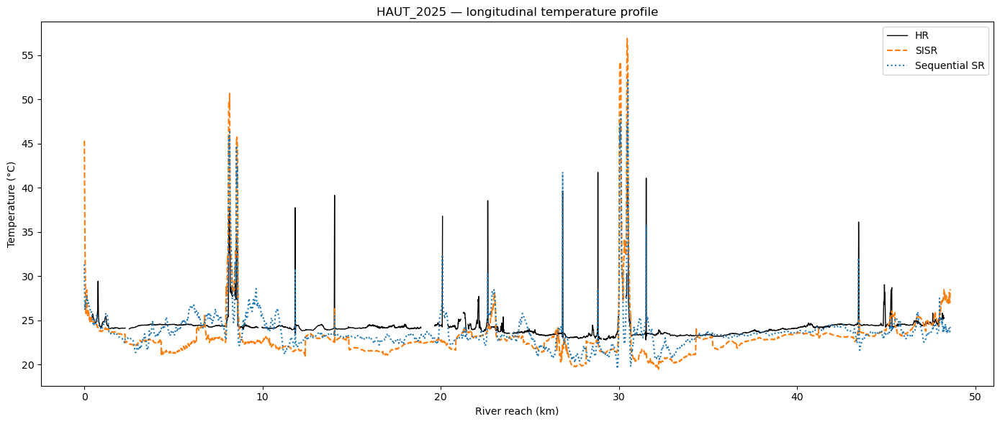

In [9]:
def sample_profile(raster, rows, cols):
    vals = map_coordinates(raster, [rows, cols], order=1, mode="constant", cval=np.nan)
    return vals  # keep NaNs as NaNs — don't fill with a global scalar

hr_profile   = sample_profile(hr_full, cl_rows, cl_cols)
sisr_profile = sample_profile(sisr_full, cl_rows, cl_cols)
seq_profile  = sample_profile(seq_full, cl_rows, cl_cols)

pixel_size_m = 7.5
step_dist = np.sqrt(np.diff(cl_rows)**2 + np.diff(cl_cols)**2) * pixel_size_m
distance_m = np.concatenate([[0], np.cumsum(step_dist)])
distance_km = distance_m / 1000

fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(distance_km, hr_profile, color="black", lw=1, label="HR")
ax.plot(distance_km, sisr_profile, color="tab:orange", ls="--", label="SISR")
ax.plot(distance_km, seq_profile, color="tab:blue", ls=":", label="Sequential SR")
ax.set_xlabel("River reach (km)")
ax.set_ylabel("Temperature (°C)")
ax.set_title(f"{CAMPAIGN} — longitudinal temperature profile")
ax.legend()
plt.tight_layout()
# plt.savefig(f"{CAMPAIGN}_longitudinal_profile.png", dpi=600, bbox_inches="tight")
plt.show()

In [9]:
sisr_profile_mae = np.nanmean(np.abs(sisr_profile - hr_profile))
seq_profile_mae  = np.nanmean(np.abs(seq_profile - hr_profile))
print(f"SISR profile MAE: {sisr_profile_mae:.3f}°C")
print(f"Sequential profile MAE: {seq_profile_mae:.3f}°C")

SISR profile MAE: 2.020°C
Sequential profile MAE: 1.488°C


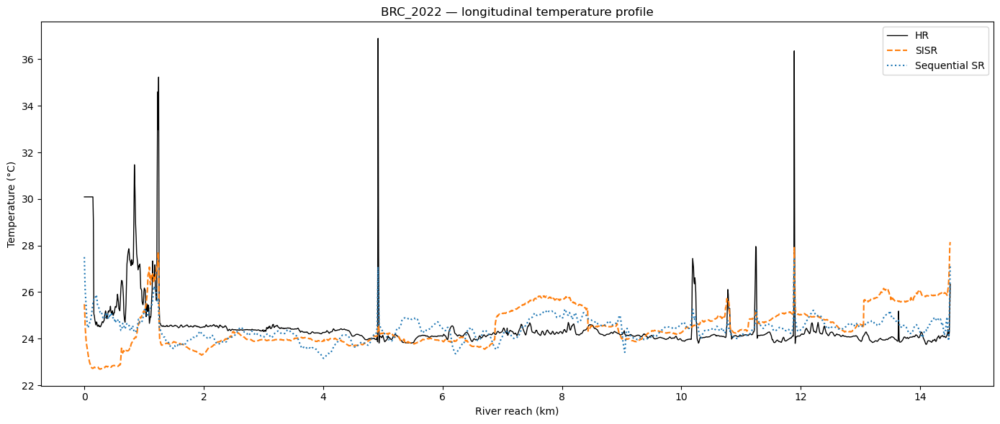

In [9]:
def sample_profile(raster, rows, cols):
    filled = np.where(np.isnan(raster), np.nanmean(raster), raster)
    return map_coordinates(filled, [rows, cols], order=1, mode="nearest")

hr_profile   = sample_profile(hr_full, cl_rows, cl_cols)
sisr_profile = sample_profile(sisr_full, cl_rows, cl_cols)
seq_profile  = sample_profile(seq_full, cl_rows, cl_cols)

pixel_size_m = 7.5
step_dist = np.sqrt(np.diff(cl_rows)**2 + np.diff(cl_cols)**2) * pixel_size_m
distance_m = np.concatenate([[0], np.cumsum(step_dist)])
distance_km = distance_m / 1000

fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(distance_km, hr_profile, color="black", lw=1, label="HR")
ax.plot(distance_km, sisr_profile, color="tab:orange", ls="--", label="SISR")
ax.plot(distance_km, seq_profile, color="tab:blue", ls=":", label="Sequential SR")
ax.set_xlabel("River reach (km)")
ax.set_ylabel("Temperature (°C)")
ax.set_title(f"{CAMPAIGN} — longitudinal temperature profile")
ax.legend()
plt.tight_layout()
# plt.savefig(f"{CAMPAIGN}_longitudinal_profile.png", dpi=600, bbox_inches="tight")
plt.show()

In [ ]:
sisr_profile_mae = np.nanmean(np.abs(sisr_profile - hr_profile))
seq_profile_mae  = np.nanmean(np.abs(seq_profile - hr_profile))
print(f"SISR profile MAE: {sisr_profile_mae:.3f}°C")
print(f"Sequential profile MAE: {seq_profile_mae:.3f}°C")

SISR profile MAE: 1.540°C
Sequential profile MAE: 1.443°C


### Local temperature heterogeneity

In [11]:
import numpy as np
from scipy.ndimage import uniform_filter
import matplotlib.pyplot as plt

WINDOW_SIZES = [7, 11, 15]   # test a few sizes — a real finding should hold up across all of them,
                              # not appear only at one arbitrary choice

def estimate_channel_width(water_mask, pixel_size_m=7.5):
    """
    Distance-transform-based estimate of typical channel width, so WINDOW can be
    chosen as a real fraction of the river's actual width instead of guessed from
    a few zoomed screenshots. For each water pixel, distance to nearest non-water
    pixel gives the local half-width; doubling it gives full cross-channel width
    at that point (exact at a straight reach, a slight underestimate at bends).
    """
    from scipy.ndimage import distance_transform_edt
    dist_px = distance_transform_edt(water_mask)          # px to nearest land, per water pixel
    half_widths_m = dist_px[water_mask] * pixel_size_m
    full_widths_m = half_widths_m * 2
    print(f"Estimated channel width — median: {np.median(full_widths_m):.0f} m "
          f"({np.median(full_widths_m)/pixel_size_m:.1f} px), "
          f"p10: {np.percentile(full_widths_m, 10):.0f} m, "
          f"p90: {np.percentile(full_widths_m, 90):.0f} m")
    return full_widths_m

_channel_widths_m = estimate_channel_width(water_full)
# rule of thumb: window should be clearly SMALLER than typical channel width, so
# "local" std reflects sub-channel variability (e.g. thalweg vs. bank) rather than
# just re-measuring the channel's own footprint. ~40-50% of the median width is a
# reasonable starting point — narrow enough to stay local, wide enough for a
# statistically meaningful sample of pixels per window.
_suggested_window_px = int(np.median(_channel_widths_m) * 0.45 / 7.5)
_suggested_window_px += (_suggested_window_px % 2 == 0)  # force odd
print(f"Suggested WINDOW ≈ {_suggested_window_px} px based on median channel width ")

Estimated channel width — median: 45 m (6.0 px), p10: 15 m, p90: 134 m
Suggested WINDOW ≈ 3 px based on median channel width 


window= 7px (52m):  HR=1.30°C  SISR=0.57°C (+56.1%)  Sequential=0.69°C (+46.5%)
window=11px (82m):  HR=1.47°C  SISR=0.75°C (+49.1%)  Sequential=0.82°C (+44.1%)
window=15px (112m):  HR=1.56°C  SISR=0.88°C (+43.5%)  Sequential=0.89°C (+42.7%)


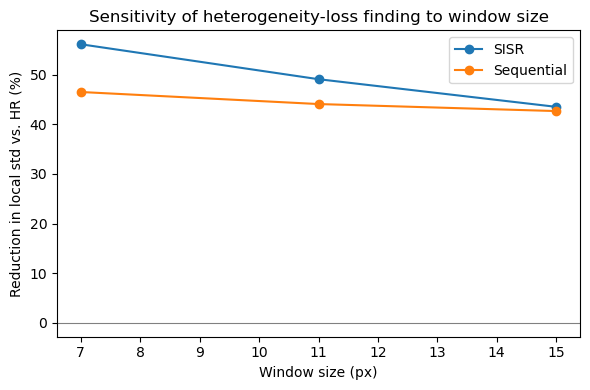

In [12]:
def local_std(raster, mask, window):
    """
    Windowed standard deviation, restricted to `mask` (e.g. water pixels).
    Non-mask pixels are excluded from the neighborhood average, not just zeroed —
    otherwise land pixels at water edges would bias the water std downward.
    Returns NaN where there isn't enough valid data in the window.
    """
    valid = mask & np.isfinite(raster)
    vals = np.where(valid, raster, 0.0)
    valid_f = valid.astype(np.float32)

    # windowed counts, sums, and sums-of-squares over valid pixels only
    count = uniform_filter(valid_f, size=window, mode="constant") * window * window
    sum_ = uniform_filter(vals, size=window, mode="constant") * window * window
    sumsq = uniform_filter(vals * vals, size=window, mode="constant") * window * window

    with np.errstate(invalid="ignore", divide="ignore"):
        mean = sum_ / count
        var = sumsq / count - mean**2
        var = np.clip(var, 0, None)  # guard against tiny negative values from float error
        std = np.sqrt(var)

    min_valid_px = (window * window) // 4   # require at least 25% real coverage in the window
    std = np.where(count >= min_valid_px, std, np.nan)
    return std

# ------------------------------------------------------------------
# Compute local std maps + summary numbers for each window size, so you can
# see whether the finding is stable or an artifact of one particular choice
# ------------------------------------------------------------------
results = {}   # window -> dict of std maps + mean values
for window in WINDOW_SIZES:
    hr_std   = local_std(hr_full,   water_full, window)
    sisr_std = local_std(sisr_full, water_full, window)
    seq_std  = local_std(seq_full,  water_full, window)

    mean_hr   = np.nanmean(hr_std)
    mean_sisr = np.nanmean(sisr_std)
    mean_seq  = np.nanmean(seq_std)
    pct_drop_sisr = 100 * (1 - mean_sisr / mean_hr)
    pct_drop_seq  = 100 * (1 - mean_seq / mean_hr)

    print(f"window={window:2d}px ({window*7.5:.0f}m):  "
          f"HR={mean_hr:.2f}°C  SISR={mean_sisr:.2f}°C ({pct_drop_sisr:+.1f}%)  "
          f"Sequential={mean_seq:.2f}°C ({pct_drop_seq:+.1f}%)")

    results[window] = dict(hr=hr_std, sisr=sisr_std, seq=seq_std,
                            pct_drop_sisr=pct_drop_sisr, pct_drop_seq=pct_drop_seq)

# ------------------------------------------------------------------
# Sensitivity plot: % reduction in local variability vs. window size —
# a real finding is roughly flat/consistent across sizes, not a spike at one
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(WINDOW_SIZES, [results[w]["pct_drop_sisr"] for w in WINDOW_SIZES], "o-", label="SISR")
ax.plot(WINDOW_SIZES, [results[w]["pct_drop_seq"] for w in WINDOW_SIZES], "o-", label="Sequential")
ax.axhline(0, color="gray", lw=0.8)
ax.set_xlabel("Window size (px)")
ax.set_ylabel("Reduction in local std vs. HR (%)")
ax.set_title("Sensitivity of heterogeneity-loss finding to window size")
ax.legend()
plt.tight_layout()
# plt.savefig("heterogeneity_window_sensitivity.png", dpi=200, bbox_inches="tight")
plt.show()


In [ ]:
import rasterio
import numpy as np

def load_mosaic(path):
    with rasterio.open(path) as src:
        return src.read(1)

all_rows = []

for CAMPAIGN in ["BRC_2022", "BRC_2023", "HAUT_2025"]:
    hr_full   = load_mosaic(OUT_DIR / f"{CAMPAIGN}_hr_mosaic.tif")
    sisr_full = load_mosaic(OUT_DIR / f"{CAMPAIGN}_sisr_mosaic.tif")
    seq_full  = load_mosaic(OUT_DIR / f"{CAMPAIGN}_seq_mosaic.tif")
    water_full = load_mosaic(OUT_DIR / f"{CAMPAIGN}_water_mask.tif") > 0.5  # back to bool

    all_rows.extend(collect_campaign_stats(CAMPAIGN, hr_full, sisr_full, seq_full, water_full))

table = build_table(all_rows)
print(table.to_string(index=False))
table.to_csv(OUT_DIR / "heterogeneity_summary_table.csv", index=False)

In [ ]:
"""
Heterogeneity summary table: std / range / CV of temperature, for water and
non-water pixels, per test campaign, restricted to the common footprint where
HR, SISR, and Sequential SR all have valid predictions (fixes the mismatched
pixel-count issue — each model otherwise covers a slightly different extent).

Usage: for each test campaign, first run your existing inference/mosaic code
to produce hr_full, sisr_full, seq_full, water_full for that CAMPAIGN (as in
the longitudinal-profile script), then call `collect_campaign_stats(...)`
below and append the result. After all campaigns are done, build the table.
"""
import numpy as np
import pandas as pd

TEST_CAMPAIGNS = ["BRC_2022", "BRC_2023", "HAUT_2025"]  # adjust if your test set differs

def restrict_to_common_valid(hr, sisr, seq):
    """Boolean mask: True only where all three rasters have finite, real values."""
    return np.isfinite(hr) & np.isfinite(sisr) & np.isfinite(seq)

def heterogeneity_row(raster, region_mask):
    vals = raster[region_mask]
    if len(vals) == 0:
        return dict(n=0, mean=np.nan, std=np.nan, range=np.nan, cv=np.nan)
    mean = np.mean(vals)
    std = np.std(vals)
    rng = np.max(vals) - np.min(vals)
    cv = std / mean if mean != 0 else np.nan
    return dict(n=len(vals), mean=mean, std=std, range=rng, cv=cv)

def collect_campaign_stats(campaign, hr_full, sisr_full, seq_full, water_full):
    """Returns a list of result dicts (one per pixel_type x model) for this campaign."""
    common_valid = restrict_to_common_valid(hr_full, sisr_full, seq_full)
    print(f"{campaign}: {common_valid.sum():,} pixels valid across all three rasters "
          f"(HR alone had {np.isfinite(hr_full).sum():,})")

    rows = []
    for pixel_type, region in [("water", water_full), ("non-water", ~water_full)]:
        region_mask = region & common_valid
        for model_name, raster in [("HR", hr_full), ("SISR", sisr_full), ("Sequential", seq_full)]:
            stats = heterogeneity_row(raster, region_mask)
            rows.append(dict(campaign=campaign, pixel_type=pixel_type, model=model_name, **stats))
    return rows

# ------------------------------------------------------------------
# Run this block once per campaign, after building hr_full/sisr_full/seq_full/
# water_full for that CAMPAIGN — collect results into `all_rows`.
# ------------------------------------------------------------------
all_rows = []
# Example for one campaign (repeat for each, or wrap your mosaic-building code
# in a function and loop over TEST_CAMPAIGNS):
#
#   CAMPAIGN = "BRC_2022"
#   ... [your existing inference/mosaic code producing hr_full, sisr_full, seq_full, water_full] ...
#   all_rows.extend(collect_campaign_stats(CAMPAIGN, hr_full, sisr_full, seq_full, water_full))
#
#   CAMPAIGN = "BRC_2023"
#   ... repeat ...
#   all_rows.extend(collect_campaign_stats(CAMPAIGN, hr_full, sisr_full, seq_full, water_full))
#
#   CAMPAIGN = "HAUT_2025"
#   ... repeat ...
#   all_rows.extend(collect_campaign_stats(CAMPAIGN, hr_full, sisr_full, seq_full, water_full))

# ------------------------------------------------------------------
# Once all_rows is populated, build and display the table
# ------------------------------------------------------------------
def build_table(all_rows):
    df = pd.DataFrame(all_rows)

    # % change vs HR, computed within each (campaign, pixel_type) group
    def add_pct_vs_hr(group):
        hr_row = group[group["model"] == "HR"].iloc[0]
        group = group.copy()
        group["std_vs_hr_%"] = 100 * (1 - group["std"] / hr_row["std"])
        group["range_vs_hr_%"] = 100 * (1 - group["range"] / hr_row["range"])
        group["cv_vs_hr_%"] = 100 * (1 - group["cv"] / hr_row["cv"])
        return group

    df = df.groupby(["campaign", "pixel_type"], group_keys=False).apply(add_pct_vs_hr)

    # pooled "All test campaigns" rows — recombine raw pixel arrays would be ideal,
    # but as a reasonable approximation, pool the per-campaign summary via weighted mean
    # (weighted by n). For an exact pooled std you'd need the raw arrays; flag this
    # as an approximation in the table if you use it.
    pooled_rows = []
    for pixel_type in df["pixel_type"].unique():
        sub = df[df["pixel_type"] == pixel_type]
        for model in sub["model"].unique():
            m = sub[sub["model"] == model]
            n_total = m["n"].sum()
            mean_pooled = np.average(m["mean"], weights=m["n"])
            # pooled variance via law of total variance (exact, not approximate)
            within = np.average(m["std"]**2, weights=m["n"])
            between = np.average((m["mean"] - mean_pooled)**2, weights=m["n"])
            std_pooled = np.sqrt(within + between)
            pooled_rows.append(dict(
                campaign="All test campaigns", pixel_type=pixel_type, model=model,
                n=n_total, mean=mean_pooled, std=std_pooled,
                range=m["range"].max(), cv=std_pooled / mean_pooled,
            ))
    pooled_df = pd.DataFrame(pooled_rows)
    pooled_df = pooled_df.groupby(["campaign", "pixel_type"], group_keys=False).apply(add_pct_vs_hr)

    full = pd.concat([df, pooled_df], ignore_index=True)
    cols = ["campaign", "pixel_type", "model", "n", "mean", "std", "range", "cv",
            "std_vs_hr_%", "range_vs_hr_%", "cv_vs_hr_%"]
    return full[cols].round(3)

if all_rows:
    table = build_table(all_rows)
    print(table.to_string(index=False))
    table.to_csv("heterogeneity_summary_table.csv", index=False)
    print("\nSaved to heterogeneity_summary_table.csv")
else:
    print("all_rows is empty — run the per-campaign mosaic-building + "
          "collect_campaign_stats() calls above first.")

Whole-reach thermal heterogeneity, water pixels only:

HR            n=  78,481  mean= 25.67°C  std= 2.16°C  range= 25.25°C  CV=0.084  [p5=23.85, p95=29.76]
SISR          n=  91,448  mean= 25.66°C  std= 2.01°C  range= 17.03°C  CV=0.078  [p5=23.55, p95=28.39]
Sequential    n=  69,568  mean= 25.60°C  std= 1.53°C  range= 38.45°C  CV=0.060  [p5=23.89, p95=28.21]

Relative to HR:
SISR          std: +7.2%   range: +32.6%   CV: +7.2%
Sequential    std: +29.2%   range: -52.3%   CV: +29.0%


In [15]:
seq_vals = seq_full[water_full & np.isfinite(seq_full)]
print("Sequential min/max:", seq_vals.min(), seq_vals.max())
print("How many pixels near the extremes:", (seq_vals < 10).sum(), (seq_vals > 50).sum())

Sequential min/max: 20.423605 58.87739
How many pixels near the extremes: 0 4


### MISC

In [ ]:
# plot all my HR tifs to see how river looks like
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

HR_FOLDER = "/share/home/e2406751/Superresolution-TIR/data/HR_downsampled"

hr_files = sorted(Path(HR_FOLDER).glob("*.tif"))
for hr_file in hr_files:
    with rasterio.open(hr_file) as src:
        hr = src.read(1).astype(float)
        nodata = src.nodata
        if nodata is not None:
            hr[hr < -1e30] = np.nan


    plt.figure(figsize=(6, 6))
    plt.imshow(hr, cmap="inferno")
    plt.title(f"HR Image: {hr_file.name}")
    plt.colorbar(label="Temperature (°C)")
    plt.axis("off")
    plt.show()

In [1]:
import torch

from basicsr.archs.basicvsrpp_arch import BasicVSRPlusPlus


model = BasicVSRPlusPlus(
    mid_channels=64,
    num_blocks=7,
    max_residue_magnitude=10,
    is_low_res_input=True,
    cpu_cache_length=100,
)


print("\n========== feat_extract ==========")
print(model.feat_extract)

print("\n========== children ==========")
for name, module in model.feat_extract.named_children():
    print(name, "->", module)


print("\n========== parameters ==========")
for name, param in model.feat_extract.named_parameters():
    print(name, param.shape)


========== feat_extract ==========
ConvResidualBlocks(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.1, inplace=True)
    (2): Sequential(
      (0): ResidualBlockNoBN(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU(inplace=True)
      )
      (1): ResidualBlockNoBN(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU(inplace=True)
      )
      (2): ResidualBlockNoBN(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU(inplace=True)
      )
      (3): ResidualBlockNoBN(
        (conv1): Conv2d(64,